In [64]:
#Import package pandas for data analysis
import pandas as pd

# Import package numpy for numeric computing
import numpy as np

# Import package matplotlib for visualisation/plotting
import matplotlib.pyplot as plt

from matplotlib.backends.backend_pdf import PdfPages

from numpy import nan

import seaborn as sns

import calendar

#pip install geopy
from geopy.geocoders import Nominatim

import geopy
from geopy.geocoders import Nominatim

#pip install geopandas
import geopandas as gpd

#pip install folium
import folium

%matplotlib inline

In [65]:
df = pd.read_csv('ppr-16722649.csv')

## Checking how many rows and column the CSV has

In [66]:
# Checking how many rows and columns the dataframe has

df.shape

(10000, 9)

In [67]:
print("The first five rows are:")

df.head()  #display first five rows

The first five rows are:


,Date of Sale (dd/mm/yyyy),Address,Postal Code,County,Price (€),Not Full Market Price,VAT Exclusive,Description of Property,Property Size Description
0,24/11/2017,"17 ST JOSEPHS PARK, MAYFIELD, CORK",NaN,Cork,"€188,500.00",No,No,Second-Hand Dwelling house /Apartment,NaN
1,21/11/2010,"Rose Cottage, Ardtarmon, Ballinfull",NaN,Sligo,"€90,000.00",No,No,Second-Hand Dwelling house /Apartment,NaN
2,14/10/2021,"7 BREFFNI ROAD, MULLAGHMORE, CLIFFONEY",NaN,Sligo,"€342,000.00",No,No,Second-Hand Dwelling house /Apartment,NaN
3,04/03/2013,"15 Onward Close, Portmarnock",NaN,Dublin,"€385,000.00",No,No,Second-Hand Dwelling house /Apartment,NaN
4,20/04/2017,"GORTNACOR, PORTSALON, LETTERKENNY",NaN,Donegal,"€42,000.00",No,No,Second-Hand Dwelling house /Apartment,NaN


In [68]:
print("The last five rows are:")

df.tail()  #display last five rows

The last five rows are:


,Date of Sale (dd/mm/yyyy),Address,Postal Code,County,Price (€),Not Full Market Price,VAT Exclusive,Description of Property,Property Size Description
9995,14/11/2012,"52 Bracken Drive, Old Tramore Road, Waterford",NaN,Waterford,"€130,000.00",No,No,Second-Hand Dwelling house /Apartment,NaN
9996,20/03/2015,"CONG RD, HEADFORD, GALWAY",NaN,Galway,"€42,000.00",No,No,Second-Hand Dwelling house /Apartment,NaN
9997,28/03/2014,"29 DOLMEN MEWS, KILKENNY RD, CARLOW",NaN,Carlow,"€35,000.00",No,No,Second-Hand Dwelling house /Apartment,NaN
9998,28/01/2013,"Arthurstown, Knocklore, Mullamore",NaN,Louth,"€150,000.00",No,No,Second-Hand Dwelling house /Apartment,NaN
9999,08/05/2020,"132 ASHFIELD EAST, KILKENNY, KILKENNY",NaN,Kilkenny,"€217,500.00",No,No,Second-Hand Dwelling house /Apartment,NaN


In [69]:
#Understanding the CSV file - checking the data types.

df.dtypes

Date of Sale (dd/mm/yyyy)    object
Address                      object
Postal Code                  object
County                       object
Price (€)                    object
Not Full Market Price        object
VAT Exclusive                object
Description of Property      object
Property Size Description    object
dtype: object

In [70]:
#Understanding the data - checking unique values in each column.

df.nunique()

Date of Sale (dd/mm/yyyy)    2749
Address                      9985
Postal Code                    22
County                         26
Price (€)                    2274
Not Full Market Price           2
VAT Exclusive                   2
Description of Property         2
Property Size Description       4
dtype: int64

## Changing Features to appropriate data type

In [71]:
#setting the data type to 'category'.

category_columns = ["Address", "Postal Code", "County", "Not Full Market Price", "VAT Exclusive", "Description of Property",
                   "Property Size Description"]

In [72]:
for column in category_columns :
    df[column] = df[column].astype('category')   #setting the columns in list as category type

In [73]:
#checking to see change has been made.

df.dtypes

Date of Sale (dd/mm/yyyy)      object
Address                      category
Postal Code                  category
County                       category
Price (€)                      object
Not Full Market Price        category
VAT Exclusive                category
Description of Property      category
Property Size Description    category
dtype: object

The format of the 'Price (€)' column needed to be changed. The data type could not be changed to a float as it was a 
string. This was changed by taking away the euro sign and commas.

In [74]:
#Changing data type for Price (€) column.
#first taking away the euro symbol
def price_format(x):
    
    if isinstance(x, str):
        return(x.replace('€', '').replace(',', ''))
    return(x)

In [75]:
df['Price (€)'] = df['Price (€)'].apply(price_format).astype('float')  

In [76]:
#Checking to see change has been made.

#df.dtypes

In [77]:
#Changing 'Date of Sale (dd/mm/yyyy)' column to data type datetime[ns].

df['Date of Sale (dd/mm/yyyy)'] = df['Date of Sale (dd/mm/yyyy)'].astype('datetime64[ns]')

In [78]:
#Checking to see change has been made

#df.dtypes

In [79]:
#Checking to see adjustment to the Price (€) column is working.
 
#df.head()

## Checking for Duplicate Rows & Columns

In [80]:
print('Number of duplicate (excluding first) rows in the table is: ', df.duplicated().sum())  #checking for duplicates

Number of duplicate (excluding first) rows in the table is:  0


In [81]:
dfT = df.T
print("Number of duplicate (excluding first) columns in the table is: ", dfT.duplicated().sum())
print("Number of duplicate (including first) columns in the table is: ",  dfT[dfT.duplicated(keep=False)].shape[0])

Number of duplicate (excluding first) columns in the table is:  0
Number of duplicate (including first) columns in the table is:  0


Result: There are no duplicate columns or rows. No changes to the CSV file are needed based on duplicates.

## Looking for constant columns

<b>Checking for constant column for categorical features</b>

In [82]:
# Print table with categorical statistics
df.select_dtypes(['category']).describe().T

,count,unique,top,freq
Address,10000,9985,"APT 1, 20 MARYS STREET, GALWAY",2
Postal Code,1809,22,Dublin 15,232
County,10000,26,Dublin,3143
Not Full Market Price,10000,2,No,9575
VAT Exclusive,10000,2,No,8437
Description of Property,10000,2,Second-Hand Dwelling house /Apartment,8408
Property Size Description,988,4,greater than or equal to 38 sq metres and less...,691


Result: As the unique column's values are greater than 1, there are no constant columns.

<b>Checking for constant columns for continuous features</b>

In [83]:
# Print table with continuous statistics
df.select_dtypes(include=['float64']).describe().T

,count,mean,std,min,25%,50%,75%,max
Price (€),10000.0,262592.39805,837897.064472,5179.0,120000.0,200000.0,307500.0,79306927.0


Result: There are no constant columns as the standard deviation is not equal to 0. If the standard deviation was equal to zero, there would be no spread/variation in the data and would then be considered a constant column.

<b>Checking for constant columns with datetime data type</b>

In [84]:
#datetime_is_numeric=True

#df.select_dtypes(include=['datetime64[ns]']).describe().T

DateTime_columns = df.select_dtypes(['datetime64[ns]']).columns
df[DateTime_columns].describe().T

<ipython-input-84-86ea5c806dd4>:6: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  df[DateTime_columns].describe().T


,count,unique,top,freq,first,last
Date of Sale (dd/mm/yyyy),10000,2749,2014-12-22,32,2010-01-03,2022-07-01


Result: As the unique column's value is greater than 1, there are no constant columns.

## Checking for any null values 

In [85]:
df.isnull().sum()

Date of Sale (dd/mm/yyyy)       0
Address                         0
Postal Code                  8191
County                          0
Price (€)                       0
Not Full Market Price           0
VAT Exclusive                   0
Description of Property         0
Property Size Description    9012
dtype: int64

In [86]:
percent_missing = df.isnull().sum() * 100 / len(df)   #diplay amount missing as percentage
missing_value_df = pd.DataFrame({'column_name': df.columns,
                                 'percent_missing': percent_missing})

missing_value_df

,column_name,percent_missing
Date of Sale (dd/mm/yyyy),Date of Sale (dd/mm/yyyy),0.00
Address,Address,0.00
Postal Code,Postal Code,81.91
County,County,0.00
Price (€),Price (€),0.00
Not Full Market Price,Not Full Market Price,0.00
VAT Exclusive,VAT Exclusive,0.00
Description of Property,Description of Property,0.00
Property Size Description,Property Size Description,90.12


7 of the 9 columns do not contain any null values. 'Property Size Description' and 'Postal Code' contain a considerable amount of null values - 90.12% and 81.91% respectively. This calls for further investigation for these columns.

### Investigating the null values in the Postal Code column:

In [87]:
df['County'].value_counts()  #see how many times county comes up 

Dublin       3143
Cork         1153
Kildare       487
Galway        481
Meath         422
Limerick      382
Wexford       332
Kerry         322
Donegal       291
Wicklow       287
Tipperary     275
Louth         262
Waterford     247
Mayo          242
Clare         236
Westmeath     216
Cavan         164
Sligo         163
Roscommon     160
Kilkenny      152
Laois         138
Offaly        122
Carlow        104
Leitrim        81
Monaghan       77
Longford       61
Name: County, dtype: int64

In [88]:
for postal_code in df['Postal Code'].unique() :  #see the different postal codes
    print(postal_code)

nan
Dublin 14
Dublin 7
Dublin 9
Dublin 16
Dublin 5
Dublin 11
Dublin 6
Dublin 4
Dublin 15
Dublin 18
Dublin 12
Dublin 8
Dublin 3
Dublin 24
Dublin 13
Dublin 1
Dublin 22
Dublin 17
Dublin 10
Dublin 2
Dublin 6w
Dublin 20


From this, it is clear that the Postal Code column is only relevant to properties sold in Dublin.

In [89]:
df = df.rename(columns={'Postal Code': 'PostalCode'})   #renaming column to make it easier

print("The number of houses sold in Dublin was:")

print(df[df.County == 'Dublin'].shape[0])       #number of properties sold in Dublin

print("\n")

print("The number of PostCodes entered was:")

print(df.PostalCode.notnull().sum())

Dublin_sold = df[df.County == 'Dublin'].shape[0]

Dublin_PostCode_entered = df.PostalCode.notnull().sum()

The number of houses sold in Dublin was:
3143


The number of PostCodes entered was:
1809


In [90]:
print("Therefore the number of postcodes that were entered for the Dublin area was: ")

Dublin_PC_entered = 100 * (Dublin_PostCode_entered/Dublin_sold)   #display as percentage 

pc_entered = str(round(Dublin_PC_entered, 2))

print(pc_entered + "%")

Therefore the number of postcodes that were entered for the Dublin area was: 
57.56%


This is nowhere near as bad as it looked on initial inspection of the data. There is a reasonable amount of data here that can be worked with to give insight into property prices in Dublin.

### Investigating null values in the Property Size Description column:

In [91]:
df.columns = df.columns.str.replace(' ', '')  #remove whitespace in or around feature names

df.columns  #check to ensure whitespaces have been removed

Index(['DateofSale(dd/mm/yyyy)', 'Address', 'PostalCode', 'County', 'Price(€)',
       'NotFullMarketPrice', 'VATExclusive', 'DescriptionofProperty',
       'PropertySizeDescription'],
      dtype='object')

In [92]:
prop_des = df[df.PropertySizeDescription.notnull()]  #number of times a property description has been entered

print("The number of times a description was entered for a property:")
print(prop_des.shape[0])

print("\n")

count_desprop_entered = prop_des.shape[0]

#prop_des.nunique()



print("\n")
print("The different property descriptions entered:")
print(prop_des['PropertySizeDescription'].unique())  


The number of times a description was entered for a property:
988




The different property descriptions entered:
['greater than or equal to 38 sq metres and les..., 'greater than 125 sq metres', 'less than 38 sq metres', 'greater than or equal to 125 sq metres']
Categories (4, object): ['greater than or equal to 38 sq metres and les..., 'greater than 125 sq metres', 'less than 38 sq metres', 'greater than or equal to 125 sq metres']


In [93]:
df[df['PropertySizeDescription'].notnull()]['DescriptionofProperty'].value_counts()  #what type of property is description inputted for 

New Dwelling house /Apartment            988
Second-Hand Dwelling house /Apartment      0
Name: DescriptionofProperty, dtype: int64

Interestingly, the property size description has only been entered for "New Dwelling house /Apartment"

In [94]:
print("The amount of properties in the CSV that are labelled as 'New Dwelling house /Apartment':")
count_newdwells_entered = df[df.DescriptionofProperty == 'New Dwelling house /Apartment'].shape[0]
print(count_newdwells_entered)

The amount of properties in the CSV that are labelled as 'New Dwelling house /Apartment':
1592


In [95]:
#So, as a percentage - for NewDwellingHouse /Apartment in terms of how much description was added as a percentage

percentage_entered = 100 * (count_desprop_entered / count_newdwells_entered)

percentage_entered = str(round(percentage_entered, 2))

print("The property description has been entered for " + percentage_entered + "% " + "'New Dwelling house /Apartment' type properties that were sold")

The property description has been entered for 62.06% 'New Dwelling house /Apartment' type properties that were sold


Similar to the entries of Dublin Postal Codes, on first glance the percentage of missing data seems suboptimal
but when further analysis is carried out, it proves to be data that can be worked with and hence should not be removed from the
data set.

## Logical Integrity

Test 1 - Checking to see the counties that are represented. If there are any placenames that do not make sense (e.g. outside Ireland or not county names), this would require further investigation.

In [96]:
#checking to see all placenames are in Ireland

for county_name in df['County'].unique() :
    print(county_name)

Cork
Sligo
Dublin
Donegal
Tipperary
Kerry
Galway
Leitrim
Laois
Wexford
Kildare
Limerick
Clare
Carlow
Westmeath
Meath
Mayo
Kilkenny
Cavan
Offaly
Louth
Monaghan
Waterford
Roscommon
Wicklow
Longford


Result: <b>Test passed</b> - All 26 counties are represented. There are no errors or further investigation needed.

Test 2: Looking at the "Not Full Market Price" column

In [97]:
NotFullMarketPrice_count = df[(df['NotFullMarketPrice'] == 'Yes')]  #df with notfullmarket price as yes

NotFullMarketPrice_count

,DateofSale(dd/mm/yyyy),Address,PostalCode,County,Price(€),NotFullMarketPrice,VATExclusive,DescriptionofProperty,PropertySizeDescription
39,2021-05-28,"8 TRIOGUE MANOR, GREENMILL LANE, PORTLAOISE",NaN,Laois,150000.00,Yes,No,Second-Hand Dwelling house /Apartment,NaN
51,2018-12-20,"19 HILLCREST WAY, LUCAN, CO DUBLIN",NaN,Dublin,325000.00,Yes,No,Second-Hand Dwelling house /Apartment,NaN
117,2019-06-17,"60 OLD MILLRACE, MONASTEREVIN, KILDARE",NaN,Kildare,189500.00,Yes,No,Second-Hand Dwelling house /Apartment,NaN
121,2020-12-16,"11 Mount William, Williamstown, Waterford",NaN,Waterford,189462.55,Yes,Yes,New Dwelling house /Apartment,NaN
132,2011-06-21,"19 ARD MOR CLOSE, TALLAGHT",NaN,Dublin,95578.11,Yes,No,Second-Hand Dwelling house /Apartment,NaN
...,...,...,...,...,...,...,...,...,...
9913,2014-11-18,"54 THE BELFRY, ENNISKERRY ROAD, STEPASIDE",Dublin 18,Dublin,148750.00,Yes,No,Second-Hand Dwelling house /Apartment,NaN
9945,2010-01-12,"Gortadrohid, Baltimore",NaN,Cork,206609.21,Yes,No,Second-Hand Dwelling house /Apartment,NaN
9950,2019-07-31,"BELPATRICK, SMARMORE, ARDEE",NaN,Louth,125000.00,Yes,No,Second-Hand Dwelling house /Apartment,NaN
9955,2018-01-24,"24 TANNERY RD, TANNERY WHARF, RATHANGAN",NaN,Kildare,235000.00,Yes,No,Second-Hand Dwelling house /Apartment,NaN


In [98]:
NotFullMarketPrice_count.shape

(425, 9)

In [99]:
#remove whitespace in or around feature names
df.columns = df.columns.str.replace(' ', '')

#check to ensure whitespaces have been removed
df.columns

Index(['DateofSale(dd/mm/yyyy)', 'Address', 'PostalCode', 'County', 'Price(€)',
       'NotFullMarketPrice', 'VATExclusive', 'DescriptionofProperty',
       'PropertySizeDescription'],
      dtype='object')

In [100]:
print(df[df.NotFullMarketPrice == 'Yes'].shape[0])

425


Result: <b>Test failed</b> - For this analysis, only the full market price will be considered. If these 425 properties were to be included, it would cause inconsistency and unreliable data as the prices could be significantly higher or lower. 

Test 3: Check if any houses sold before 01/01/2010

In [101]:
df = df.rename(columns={'DateofSale(dd/mm/yyyy)': 'DateofSale'})  #rename 

print(df.DateofSale.min())

2010-01-03 00:00:00


Result 3: <b>Test passed</b> - All data is fine and is from after 01/01/2010

Test 4: Check if the latest date has occurred

In [102]:
print(df.DateofSale.max())  #see latest date in data

2022-07-01 00:00:00


Result 4: <b>Test failed</b> - Further investigation is needed as this date has not yet occurred. 

Test 5: Checking the cheapest property prices to see if they make sense

In [103]:
df = df.rename(columns={'Price(€)': 'Price'})

In [104]:
print(df.Price.min())

5179.0


In [105]:
df.nsmallest(20, ['Price'])

,DateofSale,Address,PostalCode,County,Price,NotFullMarketPrice,VATExclusive,DescriptionofProperty,PropertySizeDescription
8790,2015-05-22,"7 Greenfields, Lanesboro Road, Roscommon",NaN,Roscommon,5179.00,No,Yes,New Dwelling house /Apartment,greater than or equal to 38 sq metres and less...
1549,2012-12-21,"Apartment 15, 82 Reuban Street, Herberton Rialto",Dublin 8,Dublin,5963.00,No,No,New Dwelling house /Apartment,greater than 125 sq metres
2854,2010-04-30,"Glenastar, Ardagh, Co. Limerick",NaN,Limerick,6829.38,No,No,Second-Hand Dwelling house /Apartment,NaN
4590,2020-05-20,"30 KNOCKMORE, ARKLOW, WICKLOW",NaN,Wicklow,7000.00,No,No,New Dwelling house /Apartment,NaN
9277,2019-01-22,"CAHERBARNAGH LR, RATHMORE, CO KERRY",NaN,Kerry,7500.00,No,No,Second-Hand Dwelling house /Apartment,NaN
3692,2011-02-12,"Ardsley, Heronford Lane, Shankhill",NaN,Dublin,7800.00,Yes,No,Second-Hand Dwelling house /Apartment,NaN
2004,2013-12-20,"68 Rosanule, Phoenix Park Racecourse, Castleknock",Dublin 15,Dublin,8000.00,No,Yes,New Dwelling house /Apartment,greater than or equal to 38 sq metres and less...
3662,2013-12-20,"4 Millrace Court, Phoenix Park Racecourse, Cas...",Dublin 15,Dublin,8000.00,No,Yes,New Dwelling house /Apartment,greater than or equal to 38 sq metres and less...
8244,2013-12-20,"71 Rosanule, Phoenix Park",Dublin 15,Dublin,8000.00,No,Yes,New Dwelling house /Apartment,greater than or equal to 38 sq metres and less...
8912,2013-12-20,"29 Millrace Road, Phoenix Park Racecourse, Cas...",Dublin 15,Dublin,8000.00,No,Yes,New Dwelling house /Apartment,greater than or equal to 38 sq metres and less...


Result 5: <b>Test passed</b> - The price seems very cheap for a new dwelling house /apartment. Checked the property online - no issues and no futher analysis needed.

Test 6: Checking the most expensive property prices.

In [106]:
print(df.Price.max())

79306927.0


In [107]:
df.nlargest(10, ['Price'])

,DateofSale,Address,PostalCode,County,Price,NotFullMarketPrice,VATExclusive,DescriptionofProperty,PropertySizeDescription
786,2019-11-13,"Fernbank, Churchtown Road, Dublin 14",Dublin 14,Dublin,79306927.00,No,Yes,New Dwelling house /Apartment,NaN
7710,2020-09-09,"Units 1-24, Block C, Gandon Grove",NaN,Dublin,7405286.34,No,Yes,New Dwelling house /Apartment,NaN
9297,2014-07-24,"Apartments 61-72 Marker Residences, Grand Cana...",Dublin 2,Dublin,5752466.40,No,No,Second-Hand Dwelling house /Apartment,NaN
3589,2020-07-24,"1-26 THE PLAZA BLOCK A, TYRRELSTOWN",Dublin 15,Dublin,5711154.84,No,No,Second-Hand Dwelling house /Apartment,NaN
7364,2020-09-18,"CLONTRA, QUINNS RD, SHANKILL",Dublin 18,Dublin,5300000.00,No,No,Second-Hand Dwelling house /Apartment,NaN
5966,2020-12-18,"Loughlion Green, Loughlion",NaN,Kildare,5245000.00,No,Yes,New Dwelling house /Apartment,NaN
1316,2012-01-17,"8 SHREWSBURY ROAD, BALLSBRIDGE, DUBLIN 4",Dublin 4,Dublin,5200000.00,No,No,Second-Hand Dwelling house /Apartment,NaN
6896,2021-05-17,"2 BLUE COAT MEWS, KEVIN ST, CORK",NaN,Cork,4250000.00,No,Yes,New Dwelling house /Apartment,NaN
1141,2021-08-03,"51 WILLOW AVENUE, PRIMROSE WAY, CELBRIDGE",NaN,Kildare,4237885.00,No,No,Second-Hand Dwelling house /Apartment,NaN
7128,2018-11-23,"APT.1 GRAVEL WALK COURT APTS, 50/52 BLACKHALL...",Dublin 7,Dublin,4184990.00,No,No,Second-Hand Dwelling house /Apartment,NaN


Result 6: <b>Test passed</b> - The property price is very high for Ireland. Further investigation was carried out to see if there was any error in inputting the data which there wasn't.

Test 7: Check if any new_dwelling was sold twice. 

In [108]:
#The data below shoes the addresses that were sold twice.

most_frequent_addresses = df['Address'].value_counts()[:20].sort_values(ascending=False)
most_frequent_addresses

APT 1, 20 MARYS STREET, GALWAY                       2
APT 14, RIVERSDALE, RATHCORMAC                       2
Upper Faughart, Dundalk                              2
2 BERRYS CLOSE SPA RD, INCHICORE DUBLIN 8, DUBLIN    2
3 O'MAHONY AVENUE, BANDON, CO CORK                   2
4 Richmond, Dunkettle, Glanmire                      2
APT 9, BELFORT COURT, SYDENHAM VILLAS DUBLIN 14      2
MONAVEA, CRETTYARD, LAOIS                            2
9 WAKEFIELD, SOUTH CIRCULAR ROAD, CO LIMERICK        2
BALLYNAGORE, BLACKWATER, ENNISCORTHY                 2
AMORSET, MANORHAMILTON, LEITRIM                      2
HILLTOWN, BALLYMITTY, WEXFORD                        2
16 CUIRT AN FHILE, MILLBANK, ROSLEVAN                2
KILLURAGH, CAPPAMORE, LIMERICK                       2
1 KESHLAWNS, KESHCARRIGAN, LEITRIM                   2
84 BRACKERNAGH, BALLINASLOE, GALWAY                  1
83 Steeplechase Green, Ratoath, Co. Meath            1
83 SANDYHILL GARDENS, BALLYMUN DUBLIN 11, DUBLIN     1
83 SIMMONS

In [109]:
#Checking to see if an address appears more than once and its' description is a 'New Dwelling house /Apartment'.

v = df.Address.value_counts()
sold_twice = df[(df.Address.isin(v.index[v.gt(1)]) & (df['DescriptionofProperty'] == 'New Dwelling house /Apartment'))]

sold_twice

sold_twice.shape[0]

0

Result 7: <b>Test Passed</b> - No rows display and hence there is no house that was labelled as "New Dwelling house /Apartment" when 
it was sold for a second time. 

Test 8: According to the Resgistration Property Price Register, "If the property is a new property, the price shown should be exclusive of VAT at 13.5%." Need to make sure this is the case.

In [110]:
#display/count the number of properties that are described as "new" and were not exlusive of VAT.

rslt_df = df[(df['VATExclusive'] == 'No') & (df['DescriptionofProperty'] == 'New Dwelling house /Apartment')]

rslt_df.head(5)

,DateofSale,Address,PostalCode,County,Price,NotFullMarketPrice,VATExclusive,DescriptionofProperty,PropertySizeDescription
667,2011-10-05,"Pairc na Fana, Union Hall",NaN,Cork,200000.0,No,No,New Dwelling house /Apartment,greater than or equal to 38 sq metres and less...
988,2013-01-29,"Apt 103, The Atrium Roebuck Hill, Mount Merrion",NaN,Dublin,270000.0,No,No,New Dwelling house /Apartment,greater than 125 sq metres
1047,2010-07-16,"Apartment 31, Ard Bhearu, Cois Bhearu Athy",NaN,Kildare,95000.0,No,No,New Dwelling house /Apartment,less than 38 sq metres
1252,2010-09-21,"77 Station Court, The Avenue, Gorey",NaN,Wexford,150000.0,No,No,New Dwelling house /Apartment,greater than or equal to 38 sq metres and less...
1307,2013-11-15,"1 Liosdubh, Newport Road, Castlebar",NaN,Mayo,60000.0,No,No,New Dwelling house /Apartment,greater than or equal to 38 sq metres and less...


In [111]:
rslt_df.shape[0]

29

Result: <b>Test Failed</b> - These 29 entries are incorrect and require further investigation. 

Test 9: Only a property described as "New Dwelling house /Apartment" should be exclusive of VAT. This test checks if any 
second hand property has been priced exclusive of VAT.

In [112]:
#if any 'Second-Hand Dwelling house /Apartment' is vat exclusive there is a mistake.

rslt_df = df[(df['VATExclusive'] == 'Yes') & (df['DescriptionofProperty'] == 'Second-Hand Dwelling house /Apartment')]

rslt_df.shape[0]

0

Result: <b>Test passed</b> - No 'Second-Hand Dwelling house /Apartment' is VAT exclusive. No changes neccessary.

Test 10 - Checking to see if the PostCodes have only been entered for the county Dublin

In [113]:
df[df['PostalCode'].notnull()]['County'].value_counts()    #counties entered other than dublin for postal code

Dublin       1808
Kildare         1
Carlow          0
Louth           0
Wexford         0
Westmeath       0
Waterford       0
Tipperary       0
Sligo           0
Roscommon       0
Offaly          0
Monaghan        0
Meath           0
Mayo            0
Longford        0
Cavan           0
Limerick        0
Leitrim         0
Laois           0
Kilkenny        0
Kerry           0
Galway          0
Donegal         0
Cork            0
Clare           0
Wicklow         0
Name: County, dtype: int64

Result: <b>Test Failed</b>. On a few occasions, the Postal Code has been entered for a county other than Dublin

<em>Save your updated / cleaned data frame to a new csv file</em> - as there have been no changes made yet, this has not been completed here

## Prepare table with descriptive statistics for all the continuous features

In [114]:
continuous_columns = df.select_dtypes(['float64']).columns
df[continuous_columns].describe().T

,count,mean,std,min,25%,50%,75%,max
Price,10000.0,262592.39805,837897.064472,5179.0,120000.0,200000.0,307500.0,79306927.0


In [115]:
#Saving descriptive statistics for continuous features to csv 

continuousFeaturesDesc = df[continuous_columns].describe().T
continuousFeaturesDesc.to_csv("continuousFeaturesDescription.csv")

## Prepare table with descriptive statistics for all the categorical features

In [116]:
categorical_columns = df.select_dtypes(['category']).columns
df[categorical_columns].describe().T

,count,unique,top,freq
Address,10000,9985,"APT 1, 20 MARYS STREET, GALWAY",2
PostalCode,1809,22,Dublin 15,232
County,10000,26,Dublin,3143
NotFullMarketPrice,10000,2,No,9575
VATExclusive,10000,2,No,8437
DescriptionofProperty,10000,2,Second-Hand Dwelling house /Apartment,8408
PropertySizeDescription,988,4,greater than or equal to 38 sq metres and less...,691


In [117]:
#Saving descriptive statistics for categorical features to csv 

CategoricalFeaturesDesc = df[categorical_columns].describe().T
CategoricalFeaturesDesc.to_csv("CategoricalFeaturesDescription.csv")

## Prepare table with descriptive statistics for all the Date/Time features

In [118]:
DateTime_columns = df.select_dtypes(['datetime64[ns]']).columns
df[DateTime_columns].describe().T

<ipython-input-118-8c6c071394c0>:2: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  df[DateTime_columns].describe().T


,count,unique,top,freq,first,last
DateofSale,10000,2749,2014-12-22,32,2010-01-03,2022-07-01


In [119]:
#Saving descriptive statistics for Date/Time features to csv 

DateTimeFeaturesDesc = df[DateTime_columns].describe().T
DateTimeFeaturesDesc.to_csv("DateTimeFeaturesDescription.csv")

<ipython-input-119-2401c09b02d4>:3: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  DateTimeFeaturesDesc = df[DateTime_columns].describe().T


## Plot histograms for all the continuous features

In [120]:
#import matplotlib.pyplot as plt
#np.inf
#plt.hist(df['Price (€)'],bins=[0,50000, 100000, 150000, 200000, 250000, 300000, 350000, 400000, 450000, 500000, 600000, 650000, 700000, 750000, 800000, 850000, 900000, 950000], edgecolor='black', linewidth=1.2)
#plt.xlabel("Price")
#plt.ylabel("Frequency")

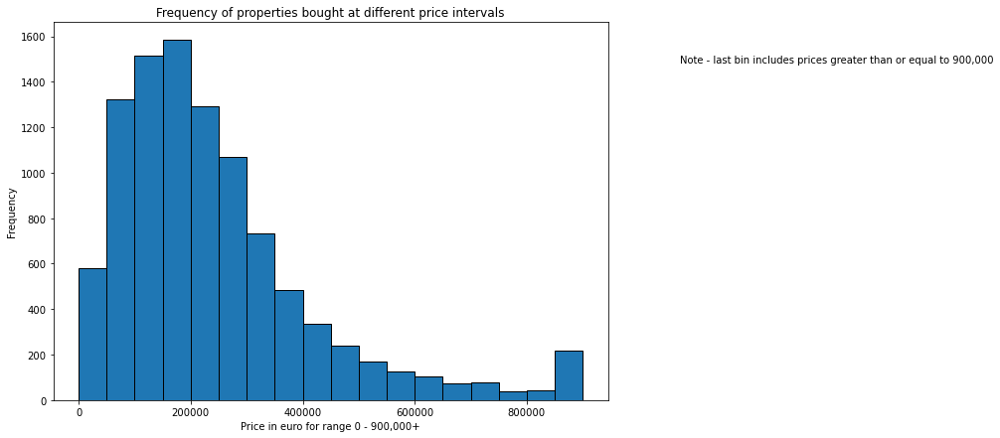

In [121]:
bins=[0,50000, 100000, 150000, 200000, 250000, 300000, 350000, 400000, 450000, 500000, 550000, 600000, 650000, 700000, 750000, 800000, 850000, 900000]

#np.clip used to show values greater than 900,000 rather than capping prices. 
plt.figure(figsize=(10, 7))
plt.figtext(1, .8, "Note - last bin includes prices greater than or equal to 900,000")
plt.hist(np.clip(df['Price'], bins[0], bins[-1]), bins=bins, edgecolor='black')
plt.xlabel("Price in euro for range 0 - 900,000+")
plt.ylabel("Frequency")
plt.title("Frequency of properties bought at different price intervals")
plt.savefig('continuous_histograms_1.pdf')




Analysis of the histogram :
* It is skewed to the right
* The mode is between €150,000 and €200,000 
* The most amount of property that was sold falls was priced between €50,000 and €300,000.
* Because of the positive skew distribution, the mean is greater than €200,000. 

## Plot box plots for all the continuous features

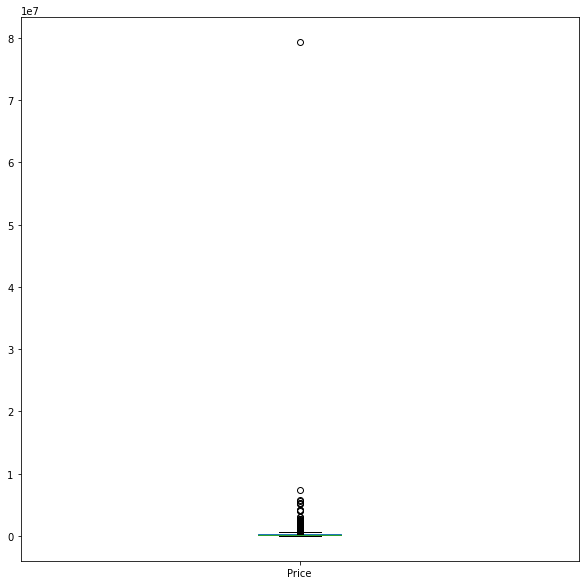

In [122]:
for col in continuous_columns:  #box plot for continuous
    f = df[col].plot(kind='box', figsize=(10,10))
    plt.show()

Due to the extreme outlier in price that has already been noted in the logical integrity section, this boxplot provides little to no use for the reader. Therefore, the decision was made to include a box plot that doesn't include outliers.

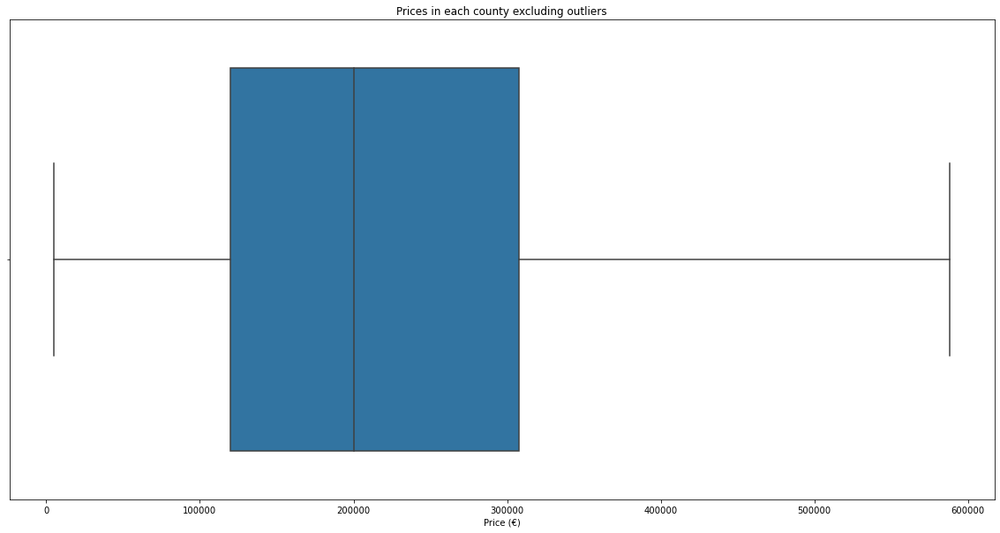

In [123]:
plt.figure(figsize=(20, 10))
#plt.xticks(rotation='vertical')
plt.title("Prices in each county excluding outliers")
sns.boxplot(x="Price", data=df, showfliers=False)   #showfliers is false to remove outliers
#plt.ylabel("Price (€)")
plt.xlabel("Price (€)")
plt.savefig('continuous_boxplot_1.pdf')
#plt.figtext(1, .8, "So we could understand the plot and get an understanding for the data, outliers have been removed")

Analysis of the box plots:
* The first boxplot makes it clear that the most expensive property in the data set is considerably more expensive than the others and thus is an extreme outlier. This will be looked into in the data quality report section.
* Disregarding the outliers, the price appears to range from approximately €5,000 - €600,000 with the median at the €200,000 mark.
* The interquartile range is €120,000 - €320,000.

## Plot bar plots for all the categorial features

The high cardinality of DateofSale column does not make it useful for data understanding. Hence, it has been separated into a month, quarter and year column.

In [124]:
df['Year'] = df['DateofSale'].dt.year  #extracting year, month and quarter from date column
df['Month'] = df['DateofSale'].dt.month
df['Quarter'] = df['DateofSale'].dt.quarter      # adapeted from https://stackoverflow.com/questions/42417954/grouping-by-month-and-filtering-by-quarter

In [125]:
df['Month'] = df['Month'].apply(lambda x: calendar.month_abbr[x])     #https://stackoverflow.com/questions/37625334/python-pandas-convert-month-int-to-month-name

In [126]:
df['Month'] = df['Month'].astype('category')   #change the data type
df['Year'] = df['Year'].astype('category')
df['Quarter'] = df['Quarter'].astype('category')

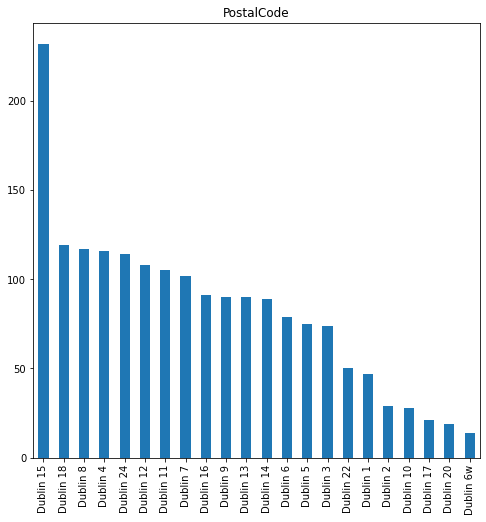

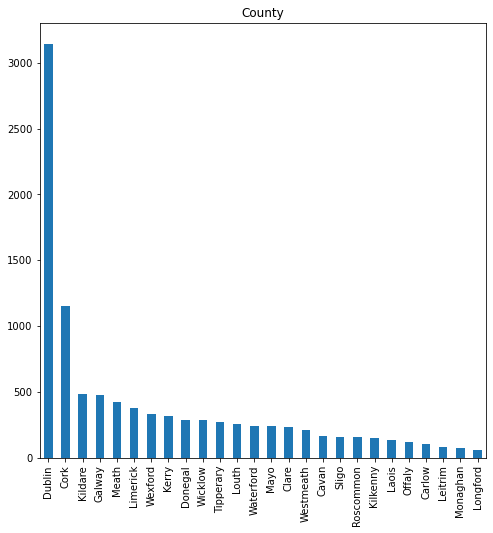

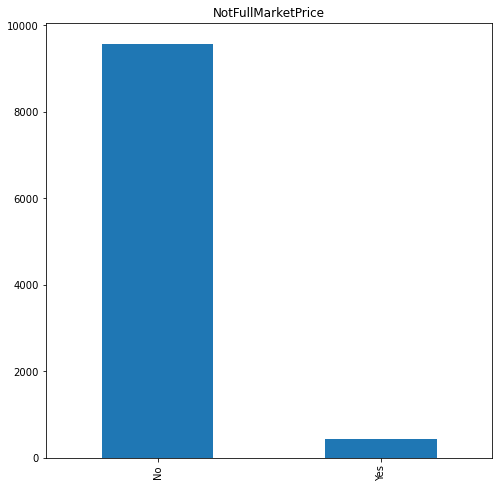

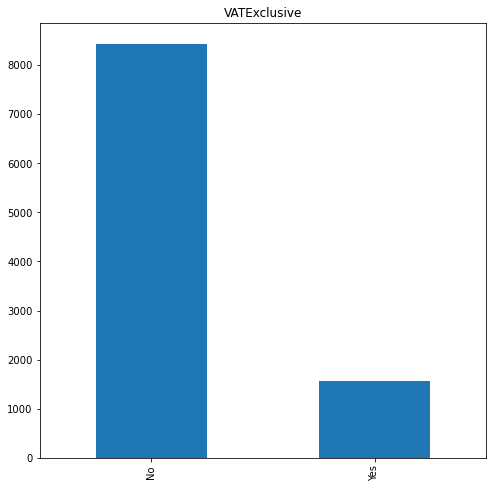

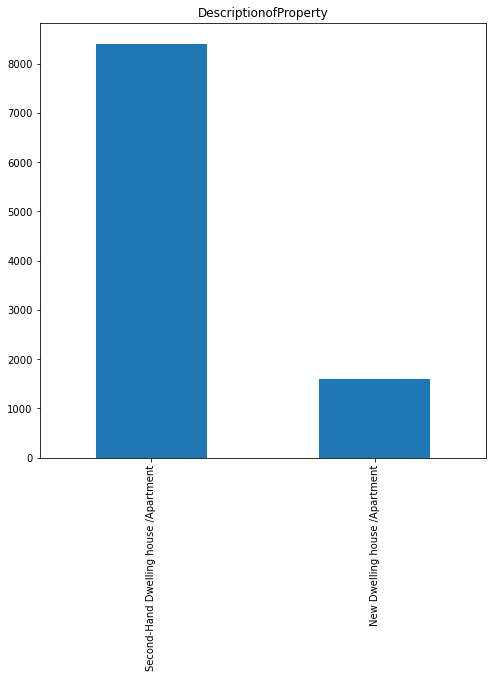

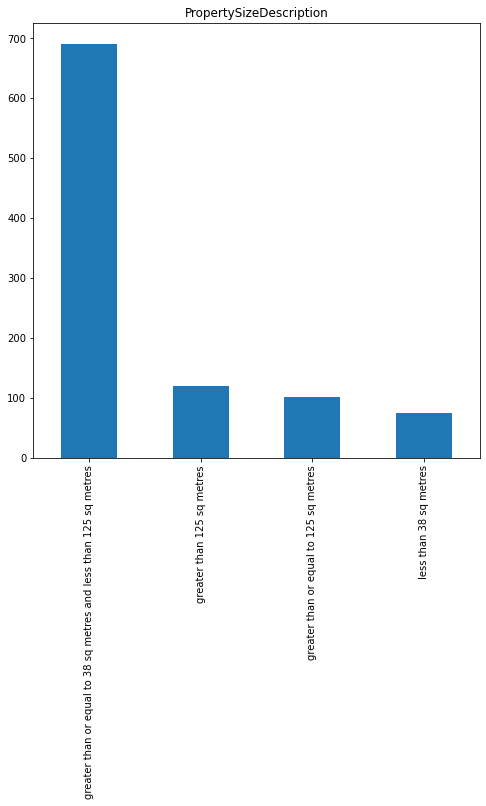

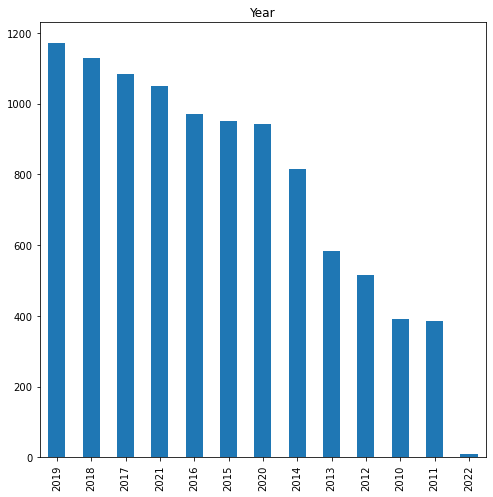

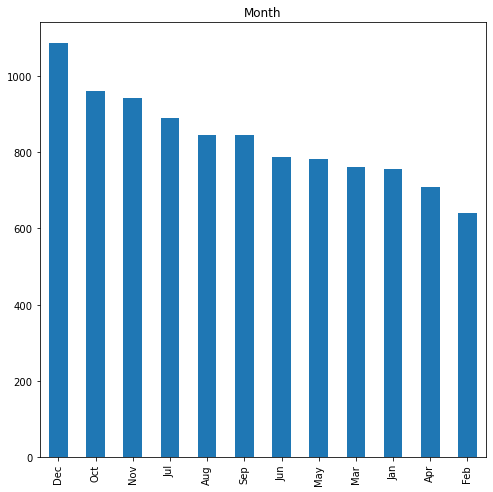

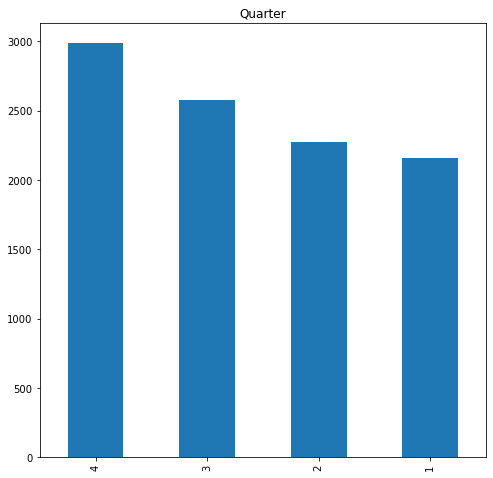

<Figure size 432x288 with 0 Axes>

In [127]:
categorical_columns = df.select_dtypes(['category']).columns

for column in categorical_columns:
    if column == "Address" :   #not displaying address col - high cardinality - little to no use for data understanding
        continue
    else :
        f = df[column].value_counts().plot(kind='bar', title=column, figsize=(8,8))

        plt.show()
        plt.savefig('categorical_histograms_1.pdf')

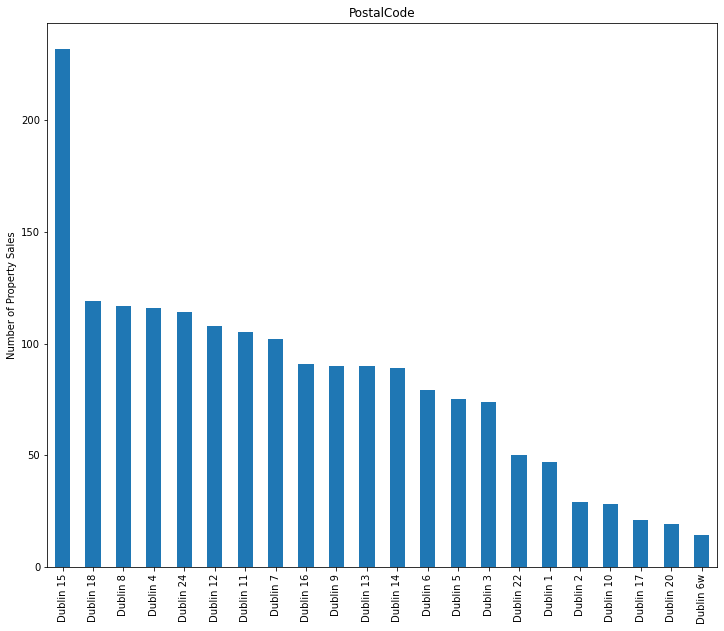

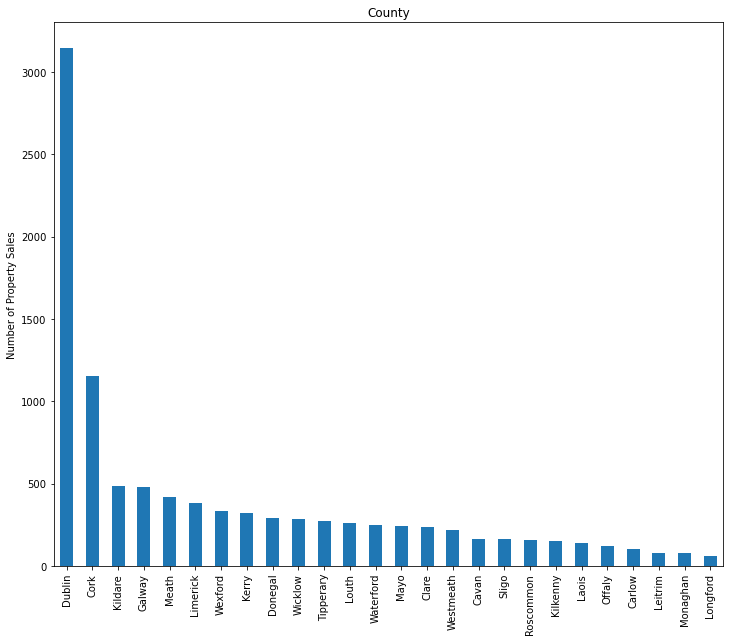

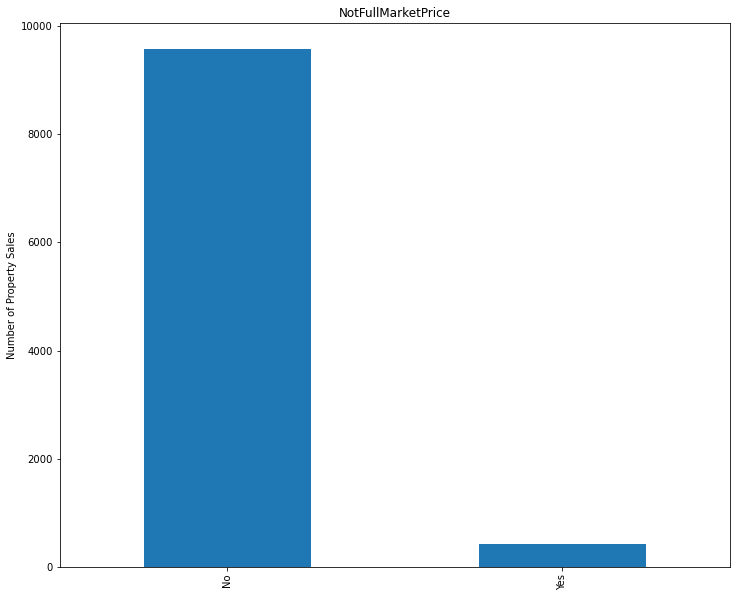

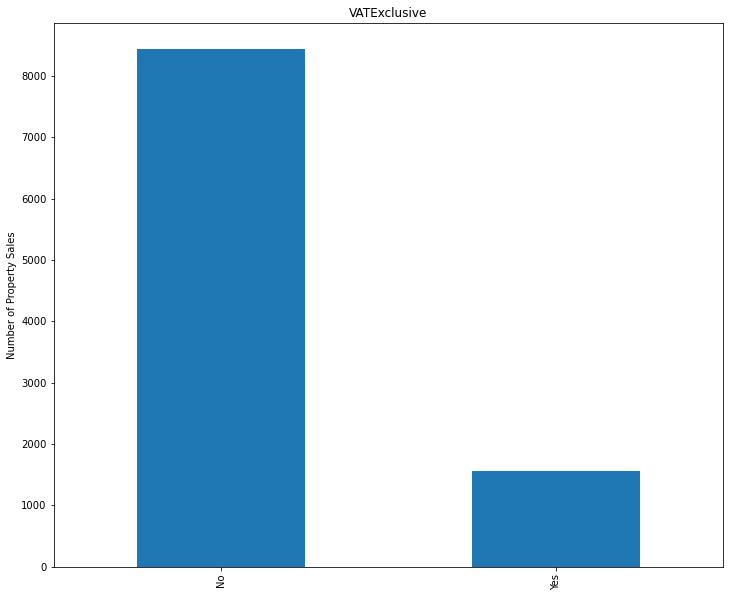

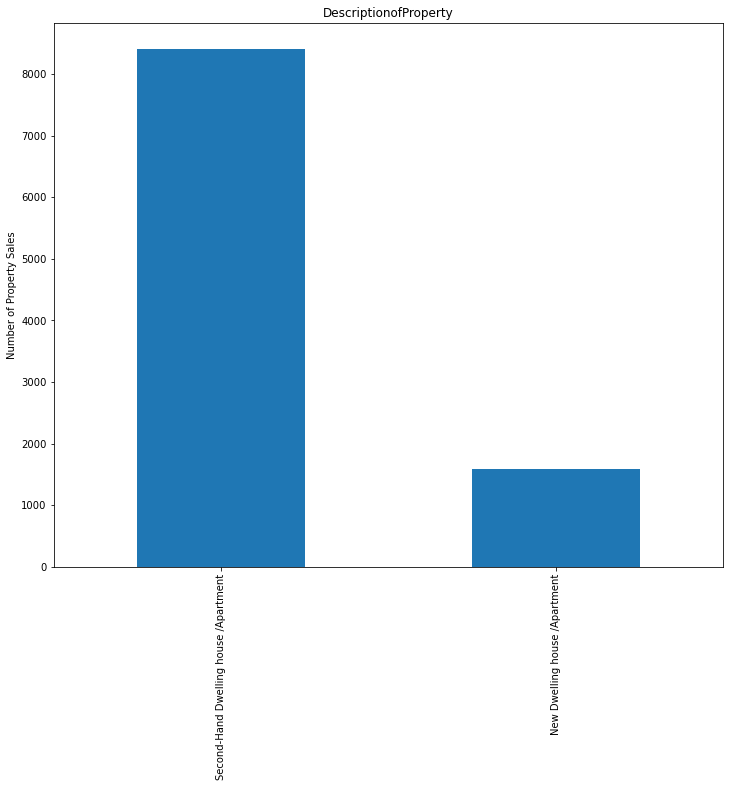

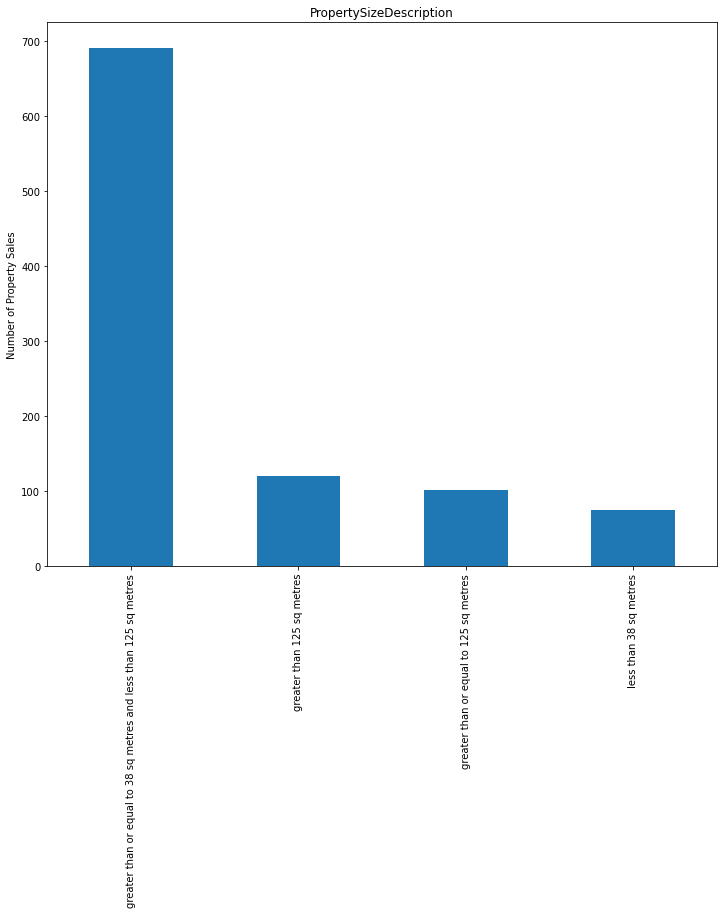

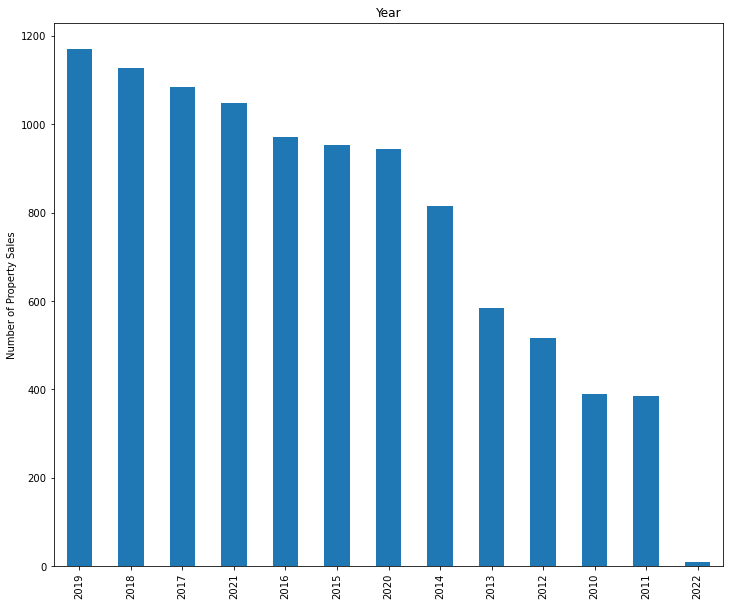

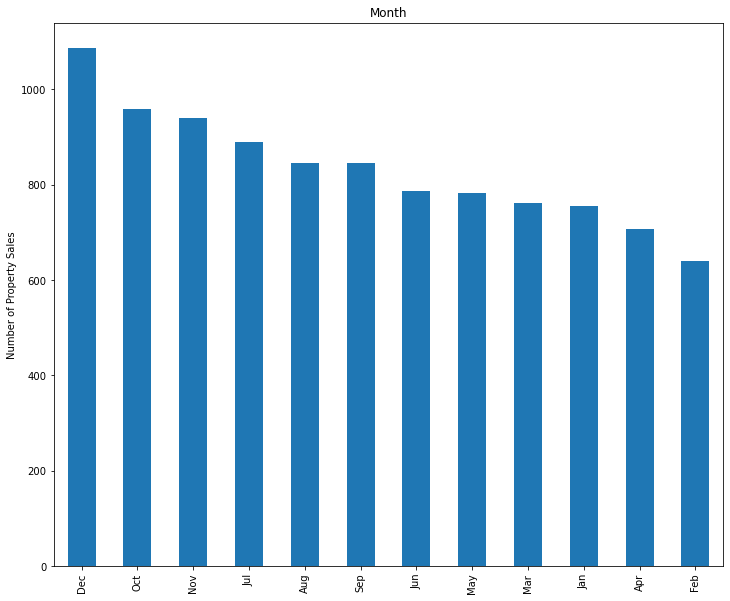

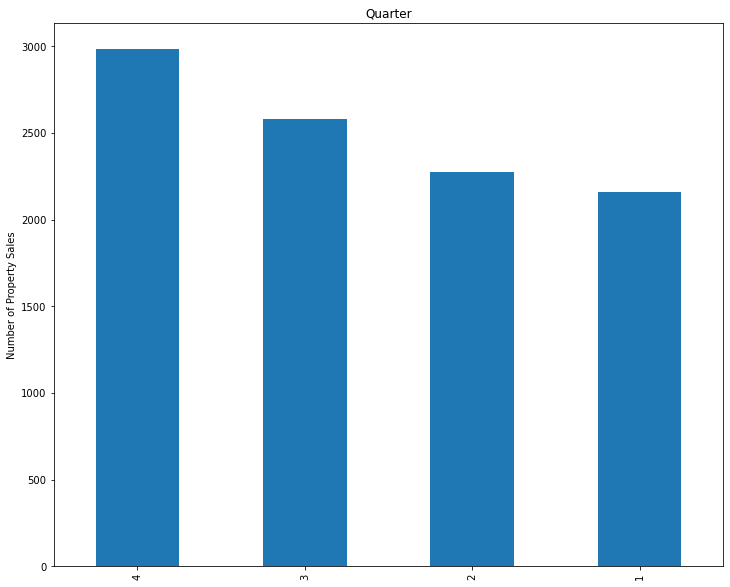

In [128]:
with PdfPages('categorical_barplots_1-1.pdf') as pp:
    for col in categorical_columns:
        
        if col == "Address" :
            continue
        
        else:
            f = df[col].value_counts().plot(kind='bar', figsize=(12,10))
            plt.title(col)
            plt.ylabel('Number of Property Sales')
            pp.savefig(f.get_figure())
            plt.show()

# Data Quality Plan


The following is a list of the different parts to this section:
* Investigating outliers in the Price column
* Changing the categories within the Property Size Description column
* Extracting the postal Code from the Address feature
* Correcting any postal codes that have been entered for a county other than Dublin
* Dropping the properties that were sold in 2022
* Dropping properties where the price is not full market price
* Dropping the column Not Full Market Price
* Including VAT for new property
* Dropping the VAT column
* Sorting the data frame by date
* Dropping the Date column

<b>Reasoning for each of these actions is given in their respective section</b>

### Investigating Outliers in the Price Field

There is a considerable difference between the 75th percentile and max price value in the data frame. This along with the histograms and the box plots from section 1 of the report suggests extreme outliers in the data.

The easiest way to handle outliers is to use a clamp transformation. This clamps all the values above an upper threshold and below a lower threshold to these threshold values, and then removing any outliers:
* lower threshold: 1st quartile value minus (1.5 x interquartile range)
* upper threshold: 3rd quartile value plus (1.5 x interquartile range)

Any values outside these thresholds are then converted to the threshold values. While this is an easy way to deal with the outliers, it is not necessarily the best option for this data set, the reason being that while the outliers are different from the rest, they provide valuable information. For example, in Dublin, on a number of occasions a house sells for €900,000 plus. This should be kept with no change to convey the high prices for certain areas. 

In terms of price outliers, the decision has been made to delete data that contains more than one property: 

The following is from the Property Price Register website (https://www.propertypriceregister.ie/):

<em>"Where a number of apartments are sold for a single price (e.g. Apartments Nos 1 to 15 Oak Drive are sold for €2m), the information on the Register depends on what was filed with the Revenue Commissioners.

For example, the filer may have input the address of - only one of the apartments (e.g. No. 1 Oak Drive) for a price of €2m; each apartment separately and divided the price between each apartment (e.g. Apartment No. 1 for €133,333, Apartment No.2 for €133,333 and so on to Apartment No. 15 for €133,333. all the apartments (e.g. Nos 1 to 15 Oak Drive) for a price of €2m. The Date of Sale is the date input by the filer of the Stamp Duty Return as the date of the Deed transferring ownership of the property."</em>

This is potentially the reason for the large price outliers. Any property that has been inputted into the data set which is an almagamation of more than one property should be removed as this would otherwise cause unreliable results. For example, in terms of price, this would be increasing the mean for an area. While it was originally thought that the price could be divided by the number of apartments/houses, there was a lack of information in some fields. Furthermore, in the case that it was made clear how many properties it included, this did not mean that each property was priced an equal amount. 



In [129]:
data_mean, data_std = df['Price'].mean(), df['Price'].std()  #getting mean and standard deviation of price

cut_off = data_std * 3   # identify outliers
lower, upper = data_mean - cut_off, data_mean + cut_off  #threshold variables

In [130]:
outliers = [x for x in df['Price'] if x < lower or x > upper]  #identifying outliers

print(outliers)

df['Address'][df['Price'] > upper]  #df displaying address for entries above upper threshold

[2800000.0, 79306927.0, 4237885.0, 5200000.0, 2999950.0, 2800000.0, 5711154.84, 3050000.0, 4093000.0, 5245000.0, 4250000.0, 4184990.0, 5300000.0, 7405286.34, 5752466.4]


400                 83 ANGLESEA RD, BALLSBRIDGE, DUBLIN 4
786                  Fernbank, Churchtown Road, Dublin 14
1141            51 WILLOW AVENUE, PRIMROSE WAY, CELBRIDGE
1316             8 SHREWSBURY ROAD, BALLSBRIDGE, DUBLIN 4
1461                 36 HERBERT PARK, BALLSBRIDGE, DUBLIN
2971        BIRCHFIELD, WESTMINSTER RD, FOXROCK DUBLIN 18
3589                 1-26 THE PLAZA  BLOCK A, TYRRELSTOWN
4988                           72 Park Avenue, Sandymount
5753                  2A-D  3A-D  4A-D, East Arran Street
5966                           Loughlion Green, Loughlion
6896                     2 BLUE COAT MEWS, KEVIN ST, CORK
7128    APT.1 GRAVEL WALK COURT APTS, 50/52  BLACKHALL...
7364                         CLONTRA, QUINNS RD, SHANKILL
7710                    Units 1-24, Block C, Gandon Grove
9297    Apartments 61-72 Marker Residences, Grand Cana...
Name: Address, dtype: category
Categories (9985, object): [''Ashbourne', Muckross Drive, Killarney', ''Avoca', Ballyhooly Road, Di

In [131]:
print('Identified outliers: %d' % len(outliers))  #print the number of outliers

Identified outliers: 15


As there is only 15, these were investigated individually. Based on the address title and further research, the following properties have been dropped as they include more than one property.

In [132]:
df.drop(index=df[df['Address'] == 'Fernbank, Churchtown Road, Dublin 14'].index, inplace=True)  #dropping the properties
df.drop(index=df[df['Address'] == '1-26 THE PLAZA  BLOCK A, TYRRELSTOWN'].index, inplace=True)
df.drop(index=df[df['Address'] == '2A-D  3A-D  4A-D, East Arran Street'].index, inplace=True)
df.drop(index=df[df['Address'] == 'Units 1-24, Block C, Gandon Grove'].index, inplace=True)
df.drop(index=df[df['Address'] == 'Apartments 61-72 Marker Residences, Grand Canal Square, Hanover Quay'].index, inplace=True)

The second approach to finding these inconsistent data entries was searching for specific words in the address field that were likely to appear in a row with more than one property. For any results returned, further research and taking into consideration the address field, the row was either kept or dropped from the data frame.

In [133]:
list_ = ['Houses', 'houses', ' and ', 'apartments', 'aparts','cottages', 'Apartments', 'Aparts']  #potential words that would have been used

for i in list_ :

    count=df['Address'].str.contains(i).sum()
    print ("There are {m} results for {a}".format(m=count, a=i))   #print number of matches

There are 1 results for Houses
There are 0 results for houses
There are 4 results for  and 
There are 0 results for apartments
There are 0 results for aparts
There are 0 results for cottages
There are 7 results for Apartments
There are 0 results for Aparts


In [134]:
df[df['Address'].str.contains('Houses')]   #looking into the match to see if it should be dropped

,DateofSale,Address,PostalCode,County,Price,NotFullMarketPrice,VATExclusive,DescriptionofProperty,PropertySizeDescription,Year,Month,Quarter
8077,2013-10-23,"13 Houses at Cooline Drive, Cobh",NaN,Cork,1511011.0,No,Yes,New Dwelling house /Apartment,greater than or equal to 38 sq metres and less...,2013,Oct,4


In [135]:
df[df['Address'].str.contains(' and ')]   #looking into the match to see if it should be dropped

,DateofSale,Address,PostalCode,County,Price,NotFullMarketPrice,VATExclusive,DescriptionofProperty,PropertySizeDescription,Year,Month,Quarter
324,2011-08-17,"65 66 and 67 An Saileachain, Raheen, Athenry",NaN,Galway,677797.97,No,Yes,New Dwelling house /Apartment,greater than 125 sq metres,2011,Aug,3
2299,2010-12-11,"37 the courtyard, Seafield Golf and Country cl...",NaN,Wexford,522000.00,No,Yes,New Dwelling house /Apartment,greater than or equal to 38 sq metres and less...,2010,Dec,4
6344,2017-05-23,"150 A 150B and 150 C BOHERMORE, CO. GALWAY",NaN,Galway,134000.00,No,No,Second-Hand Dwelling house /Apartment,NaN,2017,May,2
7297,2019-09-08,"Block 13, 57 58 and 59 Rampart Green, Rathmull...",NaN,Louth,592561.23,No,Yes,New Dwelling house /Apartment,NaN,2019,Sep,3


In [136]:
df[df['Address'].str.contains('Apartments')]     #none deleted from this one

,DateofSale,Address,PostalCode,County,Price,NotFullMarketPrice,VATExclusive,DescriptionofProperty,PropertySizeDescription,Year,Month,Quarter
4214,2020-01-04,"Apartment 5 Block D, Mount Argus Apartments",Dublin 6w,Dublin,462869.00,No,Yes,New Dwelling house /Apartment,NaN,2020,Jan,1
5060,2011-01-07,"36 Rosevale Apartments, Howth Road, Raheny",NaN,Dublin,140000.00,No,No,Second-Hand Dwelling house /Apartment,NaN,2011,Jan,1
6175,2010-12-21,"12 Bridge Apartments, Austin Friars Street, Mu...",NaN,Westmeath,100000.00,No,No,Second-Hand Dwelling house /Apartment,NaN,2010,Dec,4
6367,2014-01-23,"Apartment 4 Castelcourt Apartments, Broad Street",NaN,Limerick,35000.00,No,No,Second-Hand Dwelling house /Apartment,NaN,2014,Jan,1
6628,2019-09-16,"8051/8053 Benbulben Apartments, Clarion Road, ...",NaN,Sligo,57142.86,No,Yes,New Dwelling house /Apartment,NaN,2019,Sep,3
8556,2020-01-04,"Apartment 26 Block A, Mount Argus Apartments",Dublin 6w,Dublin,592517.00,No,Yes,New Dwelling house /Apartment,NaN,2020,Jan,1
8897,2020-01-04,"Apartment 12 Block F, Mount Argus Apartments",Dublin 6w,Dublin,602069.00,No,Yes,New Dwelling house /Apartment,NaN,2020,Jan,1


In [137]:
#From above dataframes, the following rows will be dropped.

df.drop(index=df[df['Address'] == '13 Houses at Cooline Drive, Cobh'].index, inplace=True)
df.drop(index=df[df['Address'] == '65 66 and 67 An Saileachain, Raheen, Athenry'].index, inplace=True)
df.drop(index=df[df['Address'] == 'Block 13, 57 58 and 59 Rampart Green, Rathmullen Road  Drogheda'].index, inplace=True)


In [138]:
cheap_property = df[(df['Price'] < lower)]   #checking to see if there is a price below the lower threshold

cheap_property.shape

(0, 12)

There were no outliers on the lower end of the scale.

Still looking at price outliers, box plots have been created for each property size description. Any extreme outliers in the box plot will be investigated.

<AxesSubplot:title={'center':'Prices for different sized houses'}, xlabel='PropertySizeDescription', ylabel='Price'>

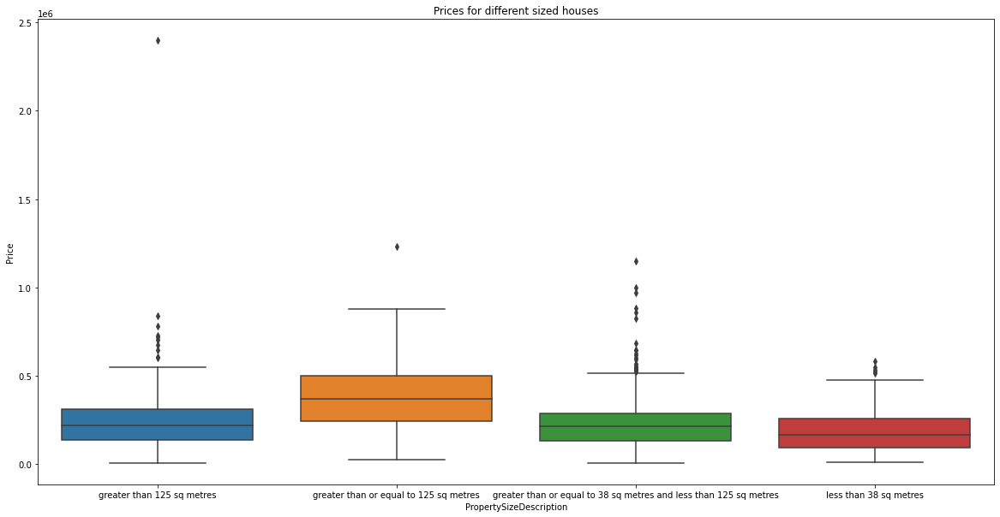

In [139]:
plt.figure(figsize=(20, 10))
#plt.xticks(rotation='vertical')
plt.title("Prices for different sized houses")
sns.boxplot(x="PropertySizeDescription", y="Price",data=df)       

In [140]:
result_df = df[(df['PropertySizeDescription'] == 'greater than or equal to 125 sq metres') & (df['Price'] > 800000)]

result_df    #checking the outliers for properties "greater than or equal to 125 sq metres"

,DateofSale,Address,PostalCode,County,Price,NotFullMarketPrice,VATExclusive,DescriptionofProperty,PropertySizeDescription,Year,Month,Quarter
2630,2017-10-08,"12 Dalkey Manor, Dalkey, County Dublin",NaN,Dublin,876652.00,No,Yes,New Dwelling house /Apartment,greater than or equal to 125 sq metres,2017,Oct,4
3200,2018-09-13,"5 Castleknock Cross, Beechpark Avenue, Castlek...",Dublin 15,Dublin,820000.00,No,Yes,New Dwelling house /Apartment,greater than or equal to 125 sq metres,2018,Sep,3
9135,2017-08-11,"20 Knockrabo Drive, Mountanville Road, Dublin 14",NaN,Dublin,810572.68,No,Yes,New Dwelling house /Apartment,greater than or equal to 125 sq metres,2017,Aug,3
9757,2019-06-20,"14 Orwell Place, Block B, Marianella",Dublin 6,Dublin,1233480.10,No,Yes,New Dwelling house /Apartment,greater than or equal to 125 sq metres,2019,Jun,2


In [141]:
result_df = df[(df['PropertySizeDescription'] == 'greater than 125 sq metres') & (df['Price'] > 800000)]

result_df  #checking the outliers for properties "greater than 125 sq metres

,DateofSale,Address,PostalCode,County,Price,NotFullMarketPrice,VATExclusive,DescriptionofProperty,PropertySizeDescription,Year,Month,Quarter
4662,2013-04-18,"51 Orwell Park, Rathgar",Dublin 6,Dublin,2400000.00,No,Yes,New Dwelling house /Apartment,greater than 125 sq metres,2013,Apr,2
6499,2012-09-21,"4 Whites Gate, Castleknock",NaN,Dublin,837004.41,No,Yes,New Dwelling house /Apartment,greater than 125 sq metres,2012,Sep,3


In [142]:
result_df = df[(df['PropertySizeDescription'] == 'greater than or equal to 38 sq metres and less than 125 sq metres') & (df['Price'] >800000)]

result_df   #checking the outliers for properties "greater than or equal to 38 sq metres and...

,DateofSale,Address,PostalCode,County,Price,NotFullMarketPrice,VATExclusive,DescriptionofProperty,PropertySizeDescription,Year,Month,Quarter
674,2015-02-27,"Apartment 399 Trimbleston, Goatstown",Dublin 14,Dublin,1000000.00,No,Yes,New Dwelling house /Apartment,greater than or equal to 38 sq metres and less...,2015,Feb,1
4923,2015-05-29,"19 39 41 & 42, The Mills Twelfh Lock, Cast...",Dublin 15,Dublin,856750.00,No,Yes,New Dwelling house /Apartment,greater than or equal to 38 sq metres and less...,2015,May,2
6058,2015-12-06,"Kylemore Estate Ard Na Gaoithe, Cashel Road, C...",NaN,Tipperary,1151000.00,No,Yes,New Dwelling house /Apartment,greater than or equal to 38 sq metres and less...,2015,Dec,4
7021,2016-07-29,"Apartment 2 55 Percy Place, Dublin",Dublin 4,Dublin,825000.00,No,Yes,New Dwelling house /Apartment,greater than or equal to 38 sq metres and less...,2016,Jul,3
8634,2016-03-31,"Apartment 358 The Oak, Trimbleston, Goatstown ...",Dublin 14,Dublin,881057.26,No,Yes,New Dwelling house /Apartment,greater than or equal to 38 sq metres and less...,2016,Mar,1
9634,2018-05-31,"8 Norabrook, Howth Road, Dublin 3",Dublin 3,Dublin,969163.00,No,Yes,New Dwelling house /Apartment,greater than or equal to 38 sq metres and less...,2018,May,2


After looking at the address fields, all entries are for one property only except for one which will be dropped from the data frame.

In [143]:
df.drop(index=df[df['Address'] == '19  39  41 & 42, The Mills   Twelfh Lock, Castleknock'].index, inplace=True)

## Changes to Property Size Description Changes

There has been a mistake in the 'Property Size Description' column with two categories overlapping. The decision has been made to replace all entries with "greater than 125 sq metres" with "greater than or equal to 125 sq metres". There are now three categories for the "Property Size Description".

In [144]:
df['PropertySizeDescription'].replace('greater than 125 sq metres','greater than or equal to 125 sq metres', inplace=True)

## Extracting the Postal Code

The address field appears to contain a large number of Postal Codes for the properties sold in Dublin. This is useful information and therefore has been extracted and placed into the "Postal Code" column. The address field will remain the same otherwise as it will be useful for obtaining coordinates in a later section.

In [145]:
df["PostalCode"] = df["PostalCode"].astype(object)  #change needed to be made - kept getting an error otherwise

In [146]:
split_list = df['Address'].str.split(',')   #splitting the address field by comma ","

counter = 0
counter_2 = 0
for row in split_list :   #for loop for each row in the list
    #print(counter)
    if 'Co' in row[-1]:
        counter += 1#some cells have "Co Dublin which is not useful" 
        pass
        
    elif ('Dublin' in row[-1] or 'dublin' in row[-1]) and len(row[-1]) < 11 and len(row[-1]) > 8:   #statement to just extract the postal codes
        df.at[counter, 'PostalCode'] = row[-1]
        counter += 1
        counter_2 += 1 #counting the number of changes
        
    else :
        counter += 1
        pass
        
print("The number of new Dublin postcodes added: ")
print(counter_2)

The number of new Dublin postcodes added: 
169


In [147]:
#change to all caps 
#get rid of '.'
#get rid of spaces
#maybe in parsing it should have been " ,"
df['PostalCode'].replace(' Dublin 1','Dublin 1', inplace=True)
df['PostalCode'].replace(' Dublin 5','Dublin 5', inplace=True)
df['PostalCode'].replace(' Dublin 16','Dublin 16', inplace=True)
df['PostalCode'].replace(' Dublin 18','Dublin 18', inplace=True)
df['PostalCode'].replace(' Dublin 7','Dublin 7', inplace=True)
df['PostalCode'].replace(' Dublin 15','Dublin 15', inplace=True)
df['PostalCode'].replace(' Dublin 24','Dublin 24', inplace=True)
df['PostalCode'].replace(' Dublin 4','Dublin 4', inplace=True)
df['PostalCode'].replace(' Dublin 6W','Dublin 6W', inplace=True)
df['PostalCode'].replace(' Dublin 3','Dublin 3', inplace=True)
df['PostalCode'].replace(' dublin 12','Dublin 12', inplace=True)
df['PostalCode'].replace(' dublin 10','Dublin 8', inplace=True)
df['PostalCode'].replace(' Dublin 12','Dublin 8', inplace=True)
df['PostalCode'].replace(' Dublin 5','Dublin 8', inplace=True)
df['PostalCode'].replace(' Dublin 11','Dublin 8', inplace=True)
df['PostalCode'].replace(' Dublin 20','Dublin 8', inplace=True)
df['PostalCode'].replace(' Dublin 14','Dublin 8', inplace=True)
df['PostalCode'].replace(' Dublin 22','Dublin 8', inplace=True)
df['PostalCode'].replace(' Dublin 13','Dublin 8', inplace=True)
df['PostalCode'].replace(' Dublin 11','Dublin 11', inplace=True)
df['PostalCode'].replace(' Dublin 2','Dublin 2', inplace=True)
df['PostalCode'].replace(' Dublin 9','Dublin 9', inplace=True)
df['PostalCode'].replace(' dublin 6w','Dublin 6W', inplace=True)
df['PostalCode'].replace(' Dublin 6w','Dublin 6W', inplace=True)
df['PostalCode'].replace(' Dublin 2.','Dublin 2', inplace=True)
df['PostalCode'].replace(' dublin 18','Dublin 18', inplace=True)
df['PostalCode'].replace(' Dublin 4.','Dublin 4', inplace=True)
df['PostalCode'].replace(' Dublin 17','Dublin 17', inplace=True)
df['PostalCode'].replace(' dublin 5','Dublin 5', inplace=True)
df['PostalCode'].replace(' Dublin 17','Dublin 17', inplace=True)
df['PostalCode'].replace(' Dublin 6','Dublin 6', inplace=True)
df['PostalCode'].replace(' Dublin 10','Dublin 10', inplace=True)
df['PostalCode'].replace(' dublin 11','Dublin 11', inplace=True)
df['PostalCode'].replace(' Dublin 8','Dublin 8', inplace=True)
df['PostalCode'].replace('Dublin 6w','Dublin 6W', inplace=True)

for postal_code in df['PostalCode'].unique() :  #making sure all postcodes are displaying as they should
    print(postal_code)
    

nan
Dublin 14
Dublin 7
Dublin 9
Dublin 16
Dublin 1
Dublin 5
Dublin 11
Dublin 6
Dublin 4
Dublin 15
Dublin 18
Dublin 12
Dublin 8
Dublin 3
Dublin 24
Dublin 22
Dublin 17
Dublin 13
Dublin 10
Dublin 2
Dublin 6W
Dublin 20


## Checking to see all Postal Codes are from Dublin :

In [148]:
df[df['PostalCode'].notnull()]['County'].value_counts()  #checking the counties with a postcode is only Dublin

Dublin       1822
Cork           16
Meath          12
Wexford        11
Wicklow         7
Limerick        7
Kildare         6
Roscommon       6
Clare           5
Galway          5
Kerry           5
Laois           5
Louth           5
Westmeath       4
Tipperary       3
Carlow          3
Mayo            3
Cavan           3
Kilkenny        3
Donegal         3
Offaly          2
Leitrim         2
Waterford       2
Sligo           1
Longford        1
Monaghan        0
Name: County, dtype: int64

In [149]:
for i in df.index:
    if df["County"][i] != "Dublin" :   #address that was found in Cork with a Dublin Postal Code
        df['PostalCode'][i] = np.nan  #change the postal code to null

<ipython-input-149-4fa1ca7eea9b>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['PostalCode'][i] = np.nan  #change the postal code to null


In [150]:
df[df['PostalCode'].notnull()]['County'].value_counts()  #checking the counties with a postcode is only Dublin

Dublin       1822
Carlow          0
Louth           0
Wexford         0
Westmeath       0
Waterford       0
Tipperary       0
Sligo           0
Roscommon       0
Offaly          0
Monaghan        0
Meath           0
Mayo            0
Longford        0
Cavan           0
Limerick        0
Leitrim         0
Laois           0
Kilkenny        0
Kildare         0
Kerry           0
Galway          0
Donegal         0
Cork            0
Clare           0
Wicklow         0
Name: County, dtype: int64

## Making changes to only include the data for years up to and including 2021.

As mentioned in the logical integrity section, there was a date entered that had not yet occurred and this was to be deleted. Furthermore, as the year is not finished and this data set could only show information up until February/March of 2022, this could cause unreliable conclusions in future sections. For example, in the examination of house sales per month, January and February would have an extra of year of sales in comparision to the other months. Hence, the decision was made to exclude all data from 2022.  

In [151]:
df['Year'] = df['Year'].astype('int64')   #had to be converted to an int for this operation
df = df[df['Year'] < 2022]    #data frame to only include years less than 2022
df['Year'].max()

2021

## Properties that are not full market price

Test 2 of the 'Logical Integrity' failed - only the full market price will be considered. If these 425 properties were to be included, it would cause inconsistency and unreliable data as the actual prices could be significantly higher or lower. 

In [152]:
df = df[df['NotFullMarketPrice'] == 'No'] #dropping the properties that are not full market price - important, it is double negative

## NotFullMarketPrice is now a constant column

As only properties with prices reflecting their full market price are not in the data frame, this column is now constant with only one value. This offers no insight and hence will be dropped.

In [153]:
df.drop('NotFullMarketPrice', axis=1, inplace=True) #dropping column

## Changes to the Prices based on VAT column

Dealing with the failed findings from test 8 in the logical integrity section including the VAT. This is important as the buyer of the house will consider what he/she paid for the property when they are deciding on a suitable selling price. All property described as "New Dwelling house /Apartment" has been increased by 13.5%. This in accordance with what is said about this type of property on the Property Price Register wesbite (https://www.propertypriceregister.ie/).

In [154]:
rslt_df = df[(df['VATExclusive'] == 'No') & (df['DescriptionofProperty'] == 'New Dwelling house /Apartment')] #checking to see how many properties where vat should have been included

In [155]:
rslt_df['Price'] = rslt_df['Price'].apply(lambda x: round(((x*113.5)/100),0))  #applying price increase of 13.5%

<ipython-input-155-d2549b17e7f4>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  rslt_df['Price'] = rslt_df['Price'].apply(lambda x: round(((x*113.5)/100),0))  #applying price increase of 13.5%


In [156]:

df.loc[df.Address.isin(rslt_df.Address), ['Price']] = rslt_df[['Price']]  #changing the prices in data frame
#df

## Dropping the VAT Column

VAT column can now be dropped - all new dwellings have included VAT so it does not tell us anything else about properties that is important to this data analysis.

In [157]:
df.drop('VATExclusive', axis=1, inplace=True)  #drop column

## Sort the Data Frame by date

There is no order to the original data frame so this has been implemented. 

In [158]:
df = df.sort_values(by="DateofSale")

## Dropping the DateOfSale Column

The DateofSale column has already been separated into month, quarter and year. This data will be used from now on. The high cardinality of DateOfSale would make it hard to make any meaningful data insighta and hence will be dropped from the data frame.

In [159]:
df.drop('DateofSale', axis=1, inplace=True)  #dropping the DateOfSale column

Below, I am just reordering the columns in the data frame. I think this makes it easier to read rather than having the time information at the end.

In [160]:
df = df[["Month", "Quarter", "Year", "Address", "PostalCode", "County", "Price", "DescriptionofProperty", "PropertySizeDescription"]]

In [161]:
df.head()

,Month,Quarter,Year,Address,PostalCode,County,Price,DescriptionofProperty,PropertySizeDescription
2770,Jan,1,2010,"Apartment 93, 20 Christchurch Place, Dubin 8",Dublin 8,Dublin,277500.00,Second-Hand Dwelling house /Apartment,NaN
3159,Jan,1,2010,"Toughbaun, Drinagh",NaN,Cork,325000.00,Second-Hand Dwelling house /Apartment,NaN
1305,Jan,1,2010,"12 The Crescent, Highfield Park, Carrigrohane",NaN,Cork,263436.12,New Dwelling house /Apartment,greater than or equal to 38 sq metres and less...
1507,Jan,1,2010,"84 ardcollum avenue, artane, dublin 5",NaN,Dublin,252000.00,Second-Hand Dwelling house /Apartment,NaN
287,Jan,1,2010,"150 Branswood, Kilkenny Road, Athy",NaN,Kildare,104844.00,New Dwelling house /Apartment,greater than or equal to 38 sq metres and less...


## Summary of data quality plan:
   
| Feature                 | Data Quality Issue                             | Handling Strategy               |
|-------------------------|------------------------------------------------|---------------------------------|
| DateofSale      | Hard to make any meaningful conclusions due to high cardinality                 | Change to Month, Quarter & Year          |
| DateofSale       | Dates that haven't occurred yet    | Drop rows  |
| DateofSale       | Lack of structure to the data frame    | Order by date  |
| Address             |  Contains information useful for other column    |   Extract the Postal Codes                |
| Postal Code         |Mistake in entries | Replace mistakes with NaN             | 
| County   | None                 | Do nothing             |
| NotFullMarketPrice           | Pricing inconsistencies  | Drop rows that are not displaying property full market price   |
| VATExclusive         |  VAT not included in all new dwellings    | Update new dwellings to reflect VAT                     |
| DescriptionofProperty       | None    | Do nothing  |
| PropertySizeDescription        | 	Overlapping cateogories   | Change name of category                      |
| Price           | Outliers consisting of more than one property             | Drop rows |     
| VAT            |  Now a constant column     | Drop feature  | 
| NotFullMarketPrice            |  Now a constant column     | Drop feature  |
| DateofSale            |  Hard to make meaningful data insights due to high cardinality     | Drop feature  |


In [162]:
#need to save to csv file with meaningful name

df.to_csv('PostDQP.csv', index=False)

# Exploring Relationships between feature pairs

<b>Q3 and Q4 has been answered together.</b> This is because I thought the analysis flowed better this way by looking at different sections by bringing in all the data at once.

The new features used are:
* Month
* Quarter
* Year
* Unemployment rates 
* Longitude
* Latitude

<em>Discuss your findings from the plots</em> - This has been completed in markdowns in this section.

## Different House Prices Around Ireland

In [163]:
max_house_prices = [(df[df['County'] == county]['Price'].max()/10**5) for county in df['County'].unique()]

/Users/conorkennedy/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:ylabel='Max Residential Property Price (€m)'>

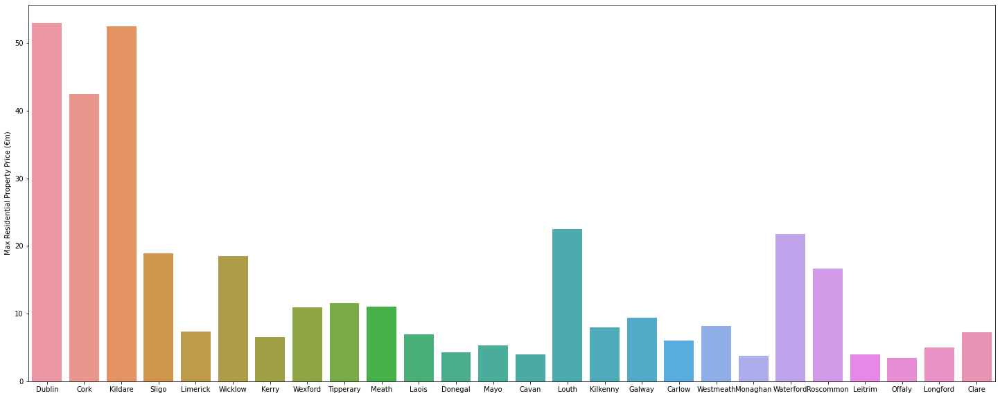

In [164]:
fig, ax = plt.subplots(figsize=(25, 10))
plt.ylabel('Max Residential Property Price (€m)')
sns.barplot(df['County'].unique(), max_house_prices)

Unsuprisingly, the highest paid property comes from Dublin. The property in Kildare was an estate. It is interesting to see that counties around Dublin (Wicklow and Kildare) were in the top 7 for maximum price paid. It is unsurprising to see that Leitrim, Cavan and Longford are amongst the bottom in this list - this could be down to the lack of big towns in each of these counties that causes property price to be on the lower end of the scale in these area.

In [165]:
min_house_prices = [(df[df['County'] == county]['Price'].min()) for county in df['County'].unique()]

/Users/conorkennedy/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:ylabel='Max Residential Property Price'>

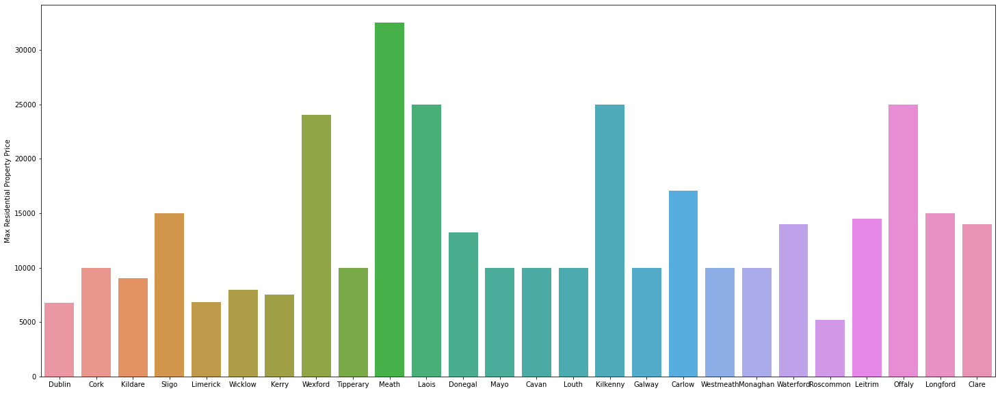

In [166]:
fig, ax = plt.subplots(figsize=(25, 10))
plt.ylabel('Max Residential Property Price')
sns.barplot(df['County'].unique(), min_house_prices)

It is worth noting that Dublin is on the lower end of the scale here - this could be down to the cheap price of small apartments that are constantly being built in the county. Having said this, €7,000 does appear to be very cheap for a Dublin property. 

In [167]:
median_house_prices = [(df[df['County'] == county]['Price'].median()) for county in df['County'].unique()]

/Users/conorkennedy/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:ylabel='Median Residential Property Price'>

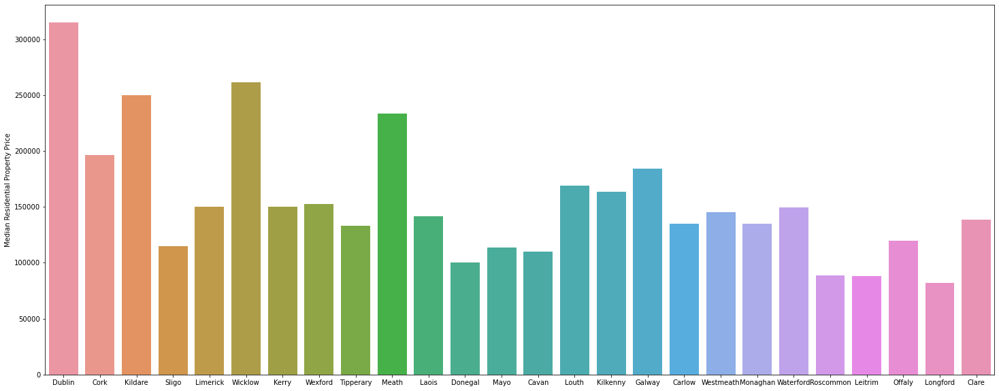

In [168]:
fig, ax = plt.subplots(figsize=(25, 10))
plt.ylabel('Median Residential Property Price')
sns.barplot(df['County'].unique(), median_house_prices)

The median has been used here in this analysis. It is clearly Dublin and its surrounding counties Kildare, Meath and Wicklow that have the highest median. Cork and Galway also have high medians with approximately €200,000 and €170,000 respectively. The reason for the high prices in these areas could be the high demand because they are in the general location for jobs with Dublin, Galway and Cork being big cities. 

With the exception of Wicklow, these five counties recorded the highest amount of property sales in the data which was shown in the first section. This confirms the high demand for these areas where a high price can then be charged.

## Average Property Price over the Years

In [169]:
prices_dublin = df[df['County'] == 'Dublin']  # Calculate prices for different areas
prices_ireland = df[df['County'] != 'xx']
prices_kildare = df[df['County'] == 'Kildare']
prices_cork = df[df['County'] == 'Cork']
prices_galway = df[df['County'] == 'Galway']


dublin_mean_price = prices_dublin.groupby('Year')['Price'].mean()  # Calculate mean prices for different areas
ireland_mean_price = prices_ireland.groupby('Year')['Price'].mean() 
kildare_mean_price = prices_kildare.groupby('Year')['Price'].mean()
cork_mean_price = prices_cork.groupby('Year')['Price'].mean()
galway_mean_price = prices_galway.groupby('Year')['Price'].mean()

Text(1, 0.8, 'This graph looks the average residential property price over the years in Ireland \nand the top four counties in terms of where property has been most frequently \nbought over this time frame')

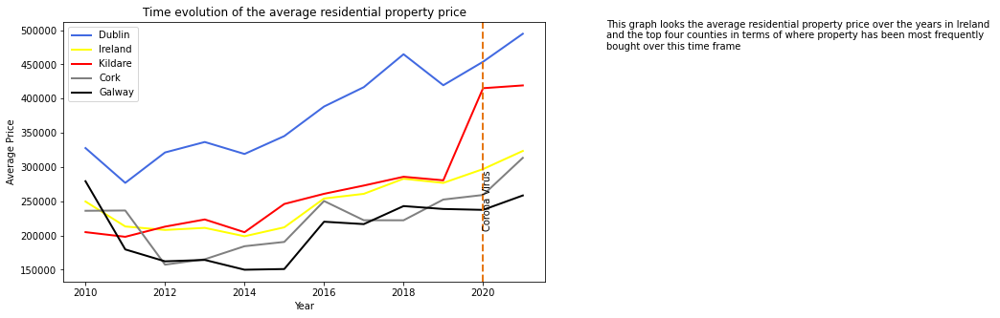

In [170]:
plt.figure(figsize = (9, 5))

dublin_mean_price.plot(y = 'average_price', color = 'royalblue', lw = 2, label = 'Dublin')  
ireland_mean_price.plot(y = 'average_price', color = 'yellow', lw = 2, label = 'Ireland')
kildare_mean_price.plot(y = 'average_price', color = 'red', lw = 2, label = 'Kildare')
cork_mean_price.plot(y = 'average_price', color = 'grey', lw = 2, label = 'Cork')
galway_mean_price.plot(y = 'average_price', color = 'black', lw = 2, label = 'Galway')

plt.axvline(x = 2020, lw = 2, color = '#E57715', linestyle = '--')
plt.text(x = 2020, y = 210000, s = 'Corona Virus', rotation = 90)
plt.title('Time evolution of the average residential property price')
plt.ylabel('Average Price')
plt.xlabel('Year')
plt.legend();
plt.figtext(1, .8, "This graph looks the average residential property price over the years in Ireland \nand the top four counties in terms of where property has been most frequently \nbought over this time frame")

There are trends common for the five lines:
* Since 2012, they are all in an upwards trajectory (price getting more expensive)
* While there is no data from before 2010, it appears the price of houses in the areas are on a downtrend for the early years that the data shows. 

This could be because Ireland was coming out of a recession and from 2012 onwards, the economy started improving and with that house prices increased. It will be interesting to see if Corona Virus has any impact on the prices. From the data that is present, it appears there is no affect and the prices are continuing to soar.


In [171]:
prices_longford = df[df['County'] == 'Longford']
prices_ireland = df[df['County'] != 'xx']
prices_monaghan = df[df['County'] == 'Monaghan']
prices_leitrim = df[df['County'] == 'Leitrim']
prices_carlow = df[df['County'] == 'Carlow']

# Calculate mean prices for the different areas
longford_mean_price = prices_longford.groupby('Year')['Price'].mean()
ireland_mean_price = prices_ireland.groupby('Year')['Price'].mean()
monaghan_mean_price = prices_monaghan.groupby('Year')['Price'].mean()
leitrim_mean_price = prices_leitrim.groupby('Year')['Price'].mean()
carlow_mean_price = prices_carlow.groupby('Year')['Price'].mean()

Text(1, 0.8, 'This graph looks the average residential property price over the years in Ireland \nand the top four counties in terms of where property has been least frequently \nbought over this time frame')

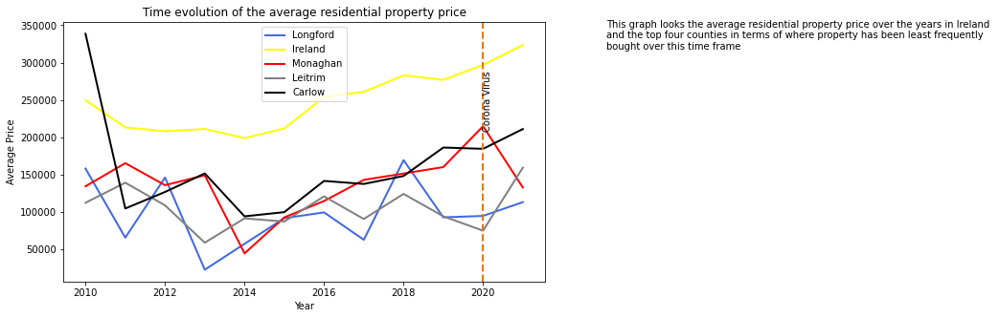

In [172]:
plt.figure(figsize = (9, 5))

longford_mean_price.plot(y = 'average_price', color = 'royalblue', lw = 2, label = 'Longford')
ireland_mean_price.plot(y = 'average_price', color = 'yellow', lw = 2, label = 'Ireland')
monaghan_mean_price.plot(y = 'average_price', color = 'red', lw = 2, label = 'Monaghan')
leitrim_mean_price.plot(y = 'average_price', color = 'grey', lw = 2, label = 'Leitrim')
carlow_mean_price.plot(y = 'average_price', color = 'black', lw = 2, label = 'Carlow')

plt.axvline(x = 2020, lw = 2, color = '#E57715', linestyle = '--')
plt.text(x = 2020, y = 210000, s = 'Corona Virus', rotation = 90)
plt.title('Time evolution of the average residential property price')
plt.ylabel('Average Price')
plt.xlabel('Year')
plt.legend();
plt.figtext(1, .8, "This graph looks the average residential property price over the years in Ireland \nand the top four counties in terms of where property has been least frequently \nbought over this time frame")

Insights from the graph:
* The price is not increasing as much in these counties as it did with Kildare, Dublin, Cork and Galway. 
* The price of Carlow drastically decreased from 2010 - 2011. This however could be due to the fact that there is not a lot of house sales in the county so one major purchase may have occurred in 2010 bringing the price up. It would be interesting to see the house prices in Carlow for years before 2010 to see if this is true.
* Worth noting that the price mean for these counties appears to range between €50,000 and €150,000 with the exception of Carlow in 2010.


Overall insights from the two graphs:
* The first graph shows how much more expensive property in Dublin tends to be in comparison to the rest of Ireland.
* It is easier to identify the upwards trend of the lines for the more popular areas. This could mean that there will be a larger range between the more popular counties and least popular in years to come if people continue to move be in close proximity to 'big city' areas.

Text(0, 0.5, 'Price (€)')

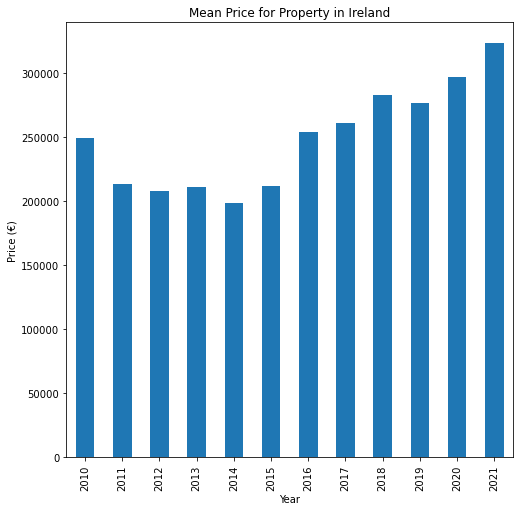

In [173]:
ireland_mean_price = prices_ireland.groupby('Year')['Price'].mean().plot(kind='bar', title="Mean Price for Property in Ireland", figsize=(8,8))
plt.xlabel('Year')

plt.xlabel('Year')
plt.ylabel("Price (€)")


Text(0, 0.5, 'Price (€)')

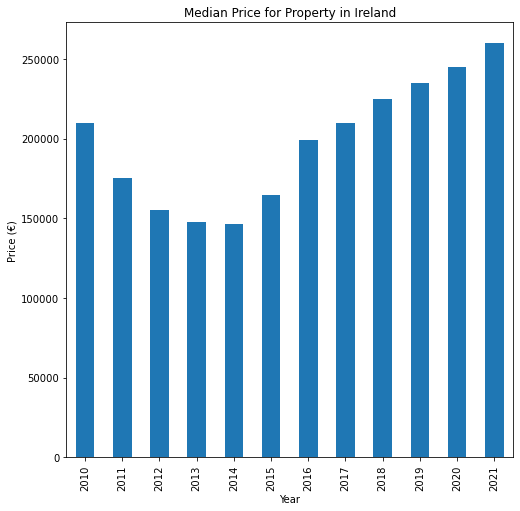

In [174]:
ireland_median_price = prices_ireland.groupby('Year')['Price'].median().plot(kind='bar', title="Median Price for Property in Ireland", figsize=(8,8))

plt.xlabel('Year')
plt.ylabel("Price (€)")

The above histograms clarify the upwards trend in property prices in Ireland from 2013/2014 onwards.

## Does time of year have any impact?

In [175]:
#https://stackoverflow.com/questions/42417954/grouping-by-month-and-filtering-by-quarter

/Users/conorkennedy/opt/anaconda3/lib/python3.8/site-packages/seaborn/categorical.py:3714: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
/Users/conorkennedy/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


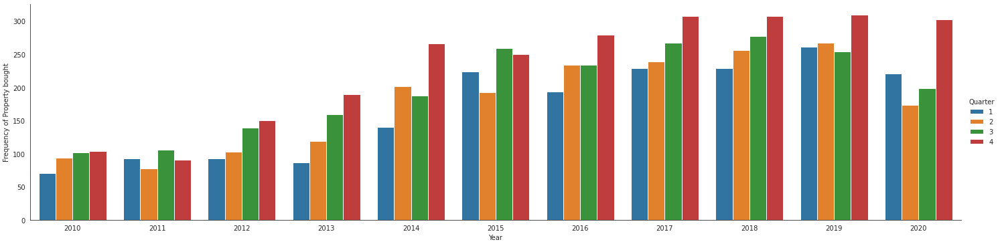

In [176]:
with sns.axes_style('white'):
    g = sns.factorplot("Year", data=df, aspect=4.0, kind='count',
                       hue='Quarter', order=range(2010, 2021))
    g.set_ylabels('Frequency of Property bought')

Interestingly for a large amount of the years (9/11), the fourth quarter (October, November and December) was the time were most house purchases were completed. A potential reason for this is that people tend to be away over Summer and planning holidays and in the Winter they have more downtime.

<AxesSubplot:xlabel='Quarter', ylabel='Price'>

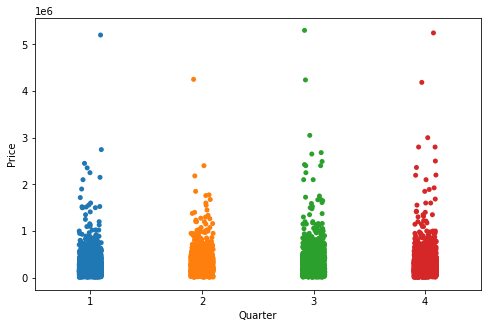

In [177]:
plt.figure(figsize = (8, 5))
sns.stripplot(x="Quarter", y = "Price", data = df)

There doesn't appear to be any significant difference in the prices paid in each quarter.

In [178]:
mean_house_prices = [(df[df['Month'] == county]['Price'].mean()) for county in df['Month'].unique()]

/Users/conorkennedy/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:ylabel='Max Residential Property Price (€m)'>

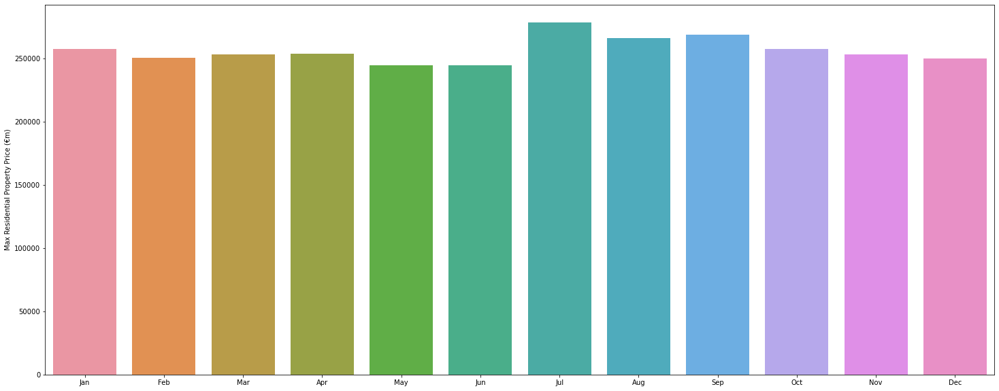

In [179]:
fig, ax = plt.subplots(figsize=(25, 10))
plt.ylabel('Max Residential Property Price (€m)')
sns.barplot(df['Month'].unique(), mean_house_prices)

The above point is clarified here. This graph shows little changes on average price of property purchases for month.

Overall, while it does appear that the fourth quarter of the year is the most popular for property purchases, there is little evidence to suggest that the time of year has an impact on the price of the property.

# South Dublin v North Dublin Property Prices

In [180]:
dublin_house_prices = [(df[df['PostalCode'] == i]['Price'].mean()) for i in df['PostalCode'].unique()]

/Users/conorkennedy/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:ylabel='Residential Property Price'>

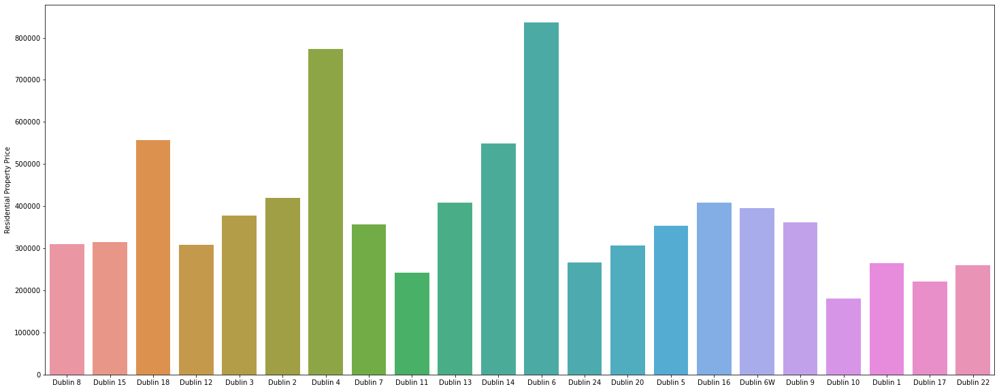

In [181]:
fig, ax = plt.subplots(figsize=(25, 10))
plt.ylabel('Residential Property Price')
sns.barplot(df['PostalCode'].unique(), dublin_house_prices)

In [182]:
dublin_postalmax_prices = df.groupby('PostalCode')['Price'].mean()
postal_top = dublin_postalmax_prices.sort_values(ascending = False).to_frame()

print('The top 5 most expensive Postal Codes areas are:')
postal_top.head(5)

The top 5 most expensive Postal Codes areas are:


,Price
PostalCode,
Dublin 6,836243.772468
Dublin 4,774167.767545
Dublin 18,556358.820684
Dublin 14,548515.458571
Dublin 2,419244.892857


All 5 of these postcodes are in South of Dublin. There are no surprising results here, all postcodes are from relatively wealthy areas.

In [183]:
Dublin_North = ["Dublin 1", "Dublin 3", "Dublin 5", "Dublin 7", "Dublin 9", "Dublin 11", "Dublin 13", "Dublin 15", "Dublin 17"]

Dublin_South = ["Dublin 2", "Dublin 4", "Dublin 6", "Dublin 8", "Dublin 10", "Dublin 12", "Dublin 14", "Dublin 16", "Dublin 6W", "Dublin 18", "Dublin 20", "Dublin 22", "Dublin 24" ]

In [184]:
dublin_north = df[df["PostalCode"].isin(Dublin_North)]

dublin_south = df[df["PostalCode"].isin(Dublin_South)]

In [185]:
dublin_north_price = dublin_north.groupby("Year")["Price"].mean()

dublin_south_price = dublin_south.groupby("Year")["Price"].mean()

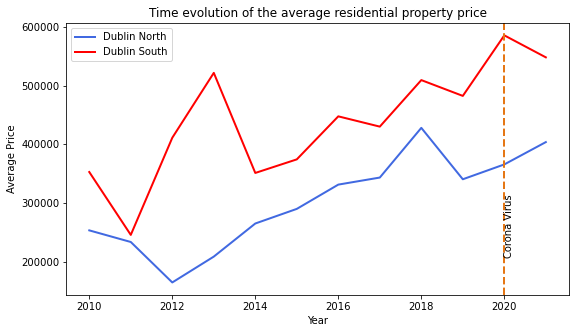

In [186]:
plt.figure(figsize = (9, 5))

dublin_north_price.plot(y = 'average_price', color = 'royalblue', lw = 2, label = 'Dublin North')
dublin_south_price.plot(y = 'average_price', color = 'red', lw = 2, label = 'Dublin South')


plt.axvline(x = 2020, lw = 2, color = '#E57715', linestyle = '--')
plt.text(x = 2020, y = 210000, s = 'Corona Virus', rotation = 90)
plt.title('Time evolution of the average residential property price')
plt.ylabel('Average Price')
plt.xlabel('Year')
plt.legend();


Again, similar to the property prices in Ireland, there is an upward trend from 2012 onwards. The South of Dublin has a mean price that is more expensive for each year. There is no drastic spike from 2011 to 2012. This should be looked into further.

Results of this section:
* South Dublin property prices are more expensive than those in the North of Dublin.
* Dublin 6, 4 and 18 are post codes with the most expensive properties on average.
* Both areas have property prices that are continuing to rise since 2014.

## What does the size of the house tell about the price?

In [187]:
rslt_dffff = df[(df['Price'] < 2000000) & (df['Year'] < 2021)]

/Users/conorkennedy/opt/anaconda3/lib/python3.8/site-packages/seaborn/categorical.py:3714: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
/Users/conorkennedy/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y, hue. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


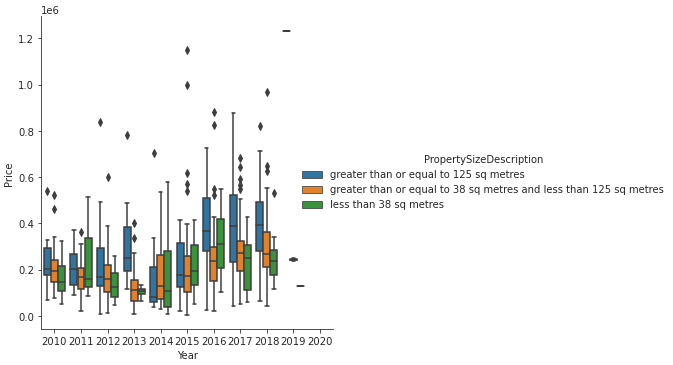

In [188]:
with sns.axes_style(style='ticks'):
    g = sns.factorplot("Year", "Price", "PropertySizeDescription", data=rslt_dffff, kind="box")
    g.set_axis_labels("Year", "Price");

There are large fluctuations in the price of the properties described as "greater than or equal to 125 sq metres" year on year, especially since 2014. Less than 38 sq metres doesn't change as much.

/Users/conorkennedy/opt/anaconda3/lib/python3.8/site-packages/seaborn/categorical.py:3714: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
/Users/conorkennedy/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


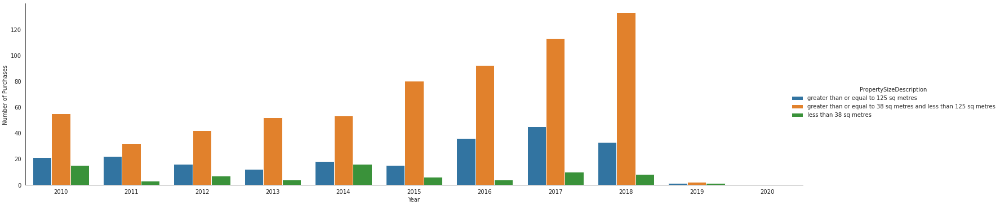

In [189]:
with sns.axes_style('white'):
    g = sns.factorplot("Year", data=df, aspect=4.0, kind='count',
                       hue='PropertySizeDescription', order=range(2010, 2021))
    g.set_ylabels('Number of Purchases')

The number of properties purchased described as "greater than or equal to 38 sq metres and less than 125 sq metres" has increased the most over the years. figure for 2018 is more than double the figure for 2011. The other descriptions do not show any sign of a pattern over the years.

From this we can deduce that the number of new dwelling houses /apartments purchased that are "greater than or equal to 38 sq metres and less than 125 sq metres" has grown rapidly over the last 8 years. This could be because of the increasing Irish population and younger families buying these houses.

/Users/conorkennedy/opt/anaconda3/lib/python3.8/site-packages/seaborn/categorical.py:3714: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
/Users/conorkennedy/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


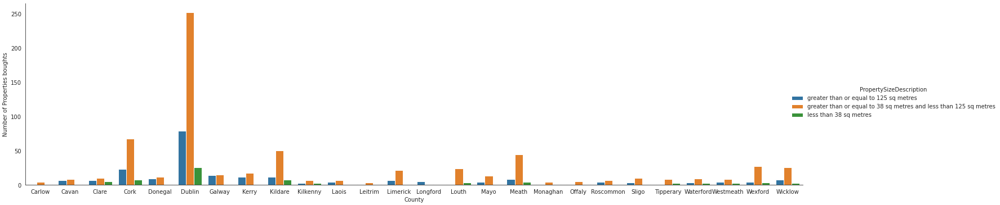

In [190]:
with sns.axes_style('white'):
    g = sns.factorplot("County", data=df, aspect=4.0, kind='count',
                       hue='PropertySizeDescription')
    g.set_ylabels('Number of Properties boughts')

There are no surprises in this graph - Dublin, Cork and Meath are all locations in demand for job purposes which has already been discussed.

## The affect of the type of house

In [191]:
prices_new = df[df['DescriptionofProperty'] == 'New Dwelling house /Apartment']
prices_old = df[df['DescriptionofProperty'] == 'Second-Hand Dwelling house /Apartment']


# Calculate mean prices for the different areas
new_mean_price = prices_new.groupby('Year')['Price'].mean()
old_mean_price = prices_old.groupby('Year')['Price'].mean()

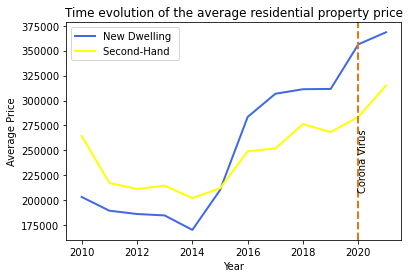

In [192]:
#plt.figure(figsize = (9, 5))

new_mean_price.plot(y = 'average_price', color = 'royalblue', lw = 2, label = 'New Dwelling ')
old_mean_price.plot(y = 'average_price', color = 'yellow', lw = 2, label = 'Second-Hand ')

plt.axvline(x = 2020, lw = 2, color = '#E57715', linestyle = '--')
plt.text(x = 2020, y = 210000, s = 'Corona Virus', rotation = 90)
plt.title('Time evolution of the average residential property price')
plt.ylabel('Average Price')
plt.xlabel('Year')
plt.legend();
#plt.figtext(1, .8, "This graph looks the average residential

/Users/conorkennedy/opt/anaconda3/lib/python3.8/site-packages/seaborn/categorical.py:3714: UserWarning: The `factorplot` function has been renamed to `catplot`. The original name will be removed in a future release. Please update your code. Note that the default `kind` in `factorplot` (`'point'`) has changed `'strip'` in `catplot`.
  warnings.warn(msg)
/Users/conorkennedy/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


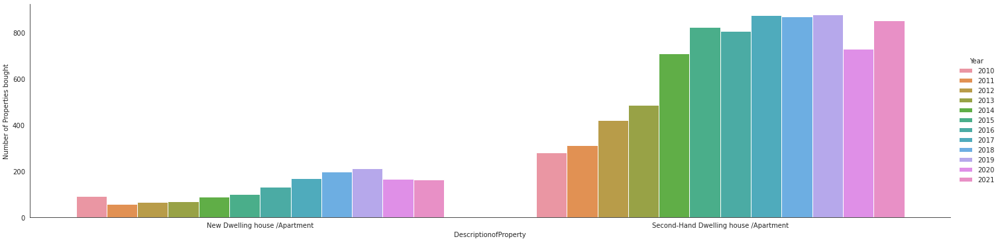

In [193]:
with sns.axes_style('white'):
    g = sns.factorplot("DescriptionofProperty", data=df, aspect=4.0, kind='count',
                       hue='Year')
    g.set_ylabels('Number of Properties bought')

In terms of property being bought, while "Second-Hand Dwelling house /Apartment" has a much higher frequency, they both seem to be growing at a relatively similar rate. The line graphs show that since 2014, house prices for new property has increased much more significantly. Hence, it is clear that a buyer must be willing to pay far more for a new house.

## Comparing House Prices with the Unemployment Rate

In [194]:
# CSV file retrieved from https://www.macrotrends.net/countries/IRL/ireland/unemployment-rate

df_unemp = pd.read_csv('irelandunemploymentrate.csv')

In [195]:
df_unemp['date'] = df_unemp['date'].astype('datetime64[ns]')

In [196]:
df_unemp['Year'] = df_unemp['date'].dt.year

In [197]:
df_unemp['Year'] = df_unemp['Year'].astype('int64')   #had to be converted to an int for this operation
df_unemp = df_unemp[df_unemp['Year'] > 2009]    #data frame to only include years less than 2022
df_unemp['Year'].min()

2010

In [198]:
df_unemp.columns = df_unemp.columns.str.replace(' ', '')  #remove whitespace in or around feature names

df_unemp.columns

Index(['date', 'UnemploymentRate(%)', 'AnnualChange', '', 'Year'], dtype='object')

In [199]:
df_unemp = df_unemp.rename(columns={'UnemploymentRate(%)': 'Rate'})

In [200]:
df['Year'] = df['Year'].astype('object')  #could not get below to work otherwise

In [201]:
ireland_mean_price = [(df[df['Year'] == year]['Price'].mean()) for year in df['Year'].unique()]

In [202]:
ireland_mean_price = [(df[df['Year'] == year]['Price'].mean()) for year in df['Year'].unique()]

In [203]:
years_to = [2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021]  #list of years

In [204]:
irish_rates = [(df_unemp[df_unemp['Year'] == year]['Rate'].mean()) for year in df_unemp['Year'].unique()]

In [205]:
years_too = [2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2020] #list of years

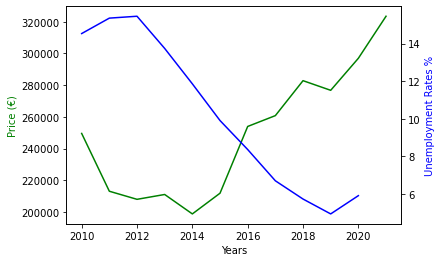

In [206]:
# adapted code from this Youtube video - https://www.youtube.com/watch?v=OQA5tUBSEo4

fig, ax1 = plt.subplots()

ax2 = ax1.twinx()  #making twin axis - two y axis on the graph

ax1.plot(years_to, ireland_mean_price, 'g-')

ax2.plot(years_too, irish_rates, 'b-')

ax1.set_xlabel('Years')
ax1.set_ylabel('Price (€)', color='g')
ax2.set_ylabel('Unemployment Rates %', color='b')

plt.show()

From this graph, it is apparent that there is an inverse correlation between Unemployment rate and the price f houses in Ireland. When unemployent rates are high, house prices are low and vice versa. Similar to other analysis in this notebook, it would be interesting to investigate this over a longer time frame to see if this continues to occur.

## Latitude and Longitude

In [208]:
df.head()

,Month,Quarter,Year,Address,PostalCode,County,Price,DescriptionofProperty,PropertySizeDescription
2770,Jan,1,2010,"Apartment 93, 20 Christchurch Place, Dubin 8",Dublin 8,Dublin,277500.00,Second-Hand Dwelling house /Apartment,NaN
3159,Jan,1,2010,"Toughbaun, Drinagh",NaN,Cork,325000.00,Second-Hand Dwelling house /Apartment,NaN
1305,Jan,1,2010,"12 The Crescent, Highfield Park, Carrigrohane",NaN,Cork,263436.12,New Dwelling house /Apartment,greater than or equal to 38 sq metres and less...
1507,Jan,1,2010,"84 ardcollum avenue, artane, dublin 5",NaN,Dublin,252000.00,Second-Hand Dwelling house /Apartment,NaN
287,Jan,1,2010,"150 Branswood, Kilkenny Road, Athy",NaN,Kildare,104844.00,New Dwelling house /Apartment,greater than or equal to 38 sq metres and less...


In [209]:
df_geo = df

In [210]:
df_geo["location_lat"] = ""
df_geo["location_long"] =""
df_geo.head()

,Month,Quarter,Year,Address,PostalCode,County,Price,DescriptionofProperty,PropertySizeDescription,location_lat,location_long
2770,Jan,1,2010,"Apartment 93, 20 Christchurch Place, Dubin 8",Dublin 8,Dublin,277500.00,Second-Hand Dwelling house /Apartment,NaN,,
3159,Jan,1,2010,"Toughbaun, Drinagh",NaN,Cork,325000.00,Second-Hand Dwelling house /Apartment,NaN,,
1305,Jan,1,2010,"12 The Crescent, Highfield Park, Carrigrohane",NaN,Cork,263436.12,New Dwelling house /Apartment,greater than or equal to 38 sq metres and less...,,
1507,Jan,1,2010,"84 ardcollum avenue, artane, dublin 5",NaN,Dublin,252000.00,Second-Hand Dwelling house /Apartment,NaN,,
287,Jan,1,2010,"150 Branswood, Kilkenny Road, Athy",NaN,Kildare,104844.00,New Dwelling house /Apartment,greater than or equal to 38 sq metres and less...,,


<b>The code below gets the latitude and longitude from the address field. It takes more than an hour to run</b>

Code adapted from: https://www.youtube.com/watch?v=gJMHbW3MK2w

In [211]:
geolocator = Nominatim(user_agent="myApp")
count = 0 #counter was placed to see how long was left, no purpose otherwise
for i in df_geo.index:
        try:
            #tries fetch address from geopy
            location = geolocator.geocode(df_geo['Address'][i])
        
            #append lat/long to column using dataframe location
            df_geo.loc[i,'location_lat'] = location.latitude
            df_geo.loc[i,'location_long'] = location.longitude
            count += 1
            print(count)
            #df_geo.loc[i,'location_address'] = location.address
        except:
            #catches exception for the case where no value is returned
            #appends null value to column
            df_geo.loc[i,'location_lat'] = ""
            df_geo.loc[i,'location_long'] = ""
            #df_geo.loc[i,'location_address'] = ""
            count += 1
            print(count)
    
    

    #print first rows as sample
#df_geo.head()

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


In [226]:
#df_geo.head()

In [215]:
df_geo.rename(columns={'location_lat': 'Latitude', 'location_long': 'Longitude'}, inplace=True)

In [227]:
#df_geo.head()

In [218]:
m = folium.Map(location=[20,5], tiles="OpenStreetMap", zoom_start=2, color = [])

In [219]:
m

Code adapted from: https://www.youtube.com/watch?v=gJMHbW3MK2w

In [221]:
count = 0

for i in range(0,len(df_geo)):
    
    if df_geo.iloc[i]['Latitude'] == "" : #if latitude wasn't retreived, do not apply to map
        count += 1
        print(count)     #counter in place to see how long left
        continue
    else :                  #25th, 50th, 75th percentile and above selected as price ranges
        
        if df_geo.iloc[i]['Price'] <= 120000 :   #if price is less than or equal to 120,000
            
        
            folium.Marker(
            location=[df_geo.iloc[i]['Latitude'], df_geo.iloc[i]['Longitude']],
            popup=df_geo.iloc[i]['Address'],  #each marker can be clicked to see address
            icon=folium.Icon(color='orange'),  #each marker orange
            ).add_to(m)  #add it to map
            count += 1
            print(count)
            
        elif df_geo.iloc[i]['Price'] <= 200000 : 
            
            folium.Marker(
            location=[df_geo.iloc[i]['Latitude'], df_geo.iloc[i]['Longitude']],
            popup=df_geo.iloc[i]['Address'],
            icon=folium.Icon(color='blue'),
            ).add_to(m)
            
            count += 1
            print(count)
            
        elif df_geo.iloc[i]['Price'] <= 307500 : 
            
            folium.Marker(
            location=[df_geo.iloc[i]['Latitude'], df_geo.iloc[i]['Longitude']],
            popup=df_geo.iloc[i]['Address'],
            icon=folium.Icon(color='yellow'),
            ).add_to(m)
            
            count += 1
            print(count)
        
        else :
            
            folium.Marker(
            location=[df_geo.iloc[i]['Latitude'], df_geo.iloc[i]['Longitude']],
            popup=df_geo.iloc[i]['Address'],
            icon=folium.Icon(color='black'),
            ).add_to(m)
            
            count += 1
            print(count)
            
            
            

# Show the map again
m

1
2
3
4
5
6
7
8
9


<ipython-input-221-b5a30c243db3>:38: UserWarning: color argument of Icon should be one of: {'beige', 'blue', 'green', 'darkblue', 'darkgreen', 'white', 'gray', 'black', 'lightred', 'darkpurple', 'red', 'purple', 'lightgreen', 'darkred', 'cadetblue', 'orange', 'pink', 'lightgray', 'lightblue'}.
  icon=folium.Icon(color='yellow'),


10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
278
279
280
281
28

In [228]:
m #display map

In [225]:
#df_geo.head()

In [229]:
df_geo.to_csv('Final_Version10_03.csv', index=False)

Due to ongoing issues with folium and the running time above to complete the functions (1 hour plus) because of my laptop, I made the decision to leave the function as it is. Improvements I would have made:
* Correct the if/else statement to only include points in Ireland - from further research, it seems to be a common issue that addresses are the same as other places in other countries which is the reason for the markers in the other countries.
* Potentially have more price intervals - different colours for every €100,000
* Have the map open up on Ireland.

The reason for implementing the map was to get a visualisation for the different areas in Ireland in terms of the frequence of houses being bought. The different coloured markers give an indication of the sort of price one can expect to pay in a certain area.

## Overall Takeaways from this section:

* The counties Dublin, Galway and Cork as well as the Greater Dublin Area are experiencing increasing growth in price.
* Since 2012, Irish property have been increasingly steadily
* While quarter 4 of the year appears to be a popular time of year to buy property, there is no correlation between time of year and price.
* Properties "greater than 38 sq metre and less than 125 sq metres" have increased the most in popularity since 2010.
* New dwelling houses / apartments are more expensive than second hand property on average.
* There is negative correlation between unemployment rate and house prices.